# Credit Risk Analysis Project

** Beginnning with basic activities of uploading the data from csv file sources**

**Project Objective**

identify patterns which indicate if a client has difficulty paying their instalments which may be used for taking actions such as denying the loan, reducing the amount of the loan, lending (to risky applicants) at a higher interest rate, etc.


**Approach/ Steps to be followed**

1. Upload
2. remove heavy null columns (>50%)
3. Go through columns_description and develop data understanding.
4. Start individual column analysis and Cleaning if necessary
5. Merge the dataframes
6. Identify Object and Numeric data of dataframe (Created 2 different dataframes to clearly identify)
7. Identify categorical columns (having <=10 unique values) and  their cleaning in the merged dataframe.
8. Segmenting the Merged dataframe based on Target group ( 0 or 1)
9. Running Univariate / Bivariate / multivariate analysis to figure out correlation
10. Conclusion : Summarise the outcome with Correlations identified.

Note : to facilitate the ease of usage, common functions are created before step 3. Calling it *step-Functions*

*Step 1*

In [381]:
# Importing necessary Libraries

import pandas as pd
import os 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
from sklearn.impute import KNNImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import OrdinalEncoder

os.chdir(r'C:\Users\vinay\OneDrive\bootcamp\Python\13. Credit risk analysis')




In [382]:
# Read Current Application data and save as "app_data"



app_data = pd.read_csv('application_data.csv')


In [383]:
app_data_copy = app_data.copy()

In [384]:
# # Read Prev applicaitons data as "prev_data"
prev_data = pd.read_csv('previous_application.csv')

***Studying both dataframes individually - column by column to make an understanding and find what might be  useful***

In [385]:
app_data.iloc[:,1:100].info()

app_data.iloc[:,100:].info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 99 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   TARGET                        307511 non-null  int64  
 1   NAME_CONTRACT_TYPE            307511 non-null  object 
 2   CODE_GENDER                   307511 non-null  object 
 3   FLAG_OWN_CAR                  307511 non-null  object 
 4   FLAG_OWN_REALTY               307511 non-null  object 
 5   CNT_CHILDREN                  307511 non-null  int64  
 6   AMT_INCOME_TOTAL              307511 non-null  float64
 7   AMT_CREDIT                    307511 non-null  float64
 8   AMT_ANNUITY                   307499 non-null  float64
 9   AMT_GOODS_PRICE               307233 non-null  float64
 10  NAME_TYPE_SUITE               306219 non-null  object 
 11  NAME_INCOME_TYPE              307511 non-null  object 
 12  NAME_EDUCATION_TYPE           307511 non-nul

There are many columns with too much null values.. lets drop cols with more than 50% null values 

*Step 2*

In [386]:
# Identify cols with 50% or more Null values

null_appdata = app_data.isnull().sum().reset_index()

null_appdata = null_appdata.rename(columns={'index':'colname', 0:'null_count'})

# app_data['SK_ID_CURR'].count()
null_appdata['null_%'] = round(null_appdata['null_count'] *100/app_data['SK_ID_CURR'].count(),1)

null_appdata.sort_values(by='null_%', ascending=False)


drop_appdata = null_appdata[null_appdata['null_%']>=50]

# put such cols in a list to be used in dropping from app_data
drop_list = []
for cols in drop_appdata['colname']:
    # print(cols)
    drop_list.append(cols)

# Drop the cols mentioned in the list of cols to be dropped 
app_data = app_data.drop(columns=drop_list)
app_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 81 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   SK_ID_CURR                    307511 non-null  int64  
 1   TARGET                        307511 non-null  int64  
 2   NAME_CONTRACT_TYPE            307511 non-null  object 
 3   CODE_GENDER                   307511 non-null  object 
 4   FLAG_OWN_CAR                  307511 non-null  object 
 5   FLAG_OWN_REALTY               307511 non-null  object 
 6   CNT_CHILDREN                  307511 non-null  int64  
 7   AMT_INCOME_TOTAL              307511 non-null  float64
 8   AMT_CREDIT                    307511 non-null  float64
 9   AMT_ANNUITY                   307499 non-null  float64
 10  AMT_GOODS_PRICE               307233 non-null  float64
 11  NAME_TYPE_SUITE               306219 non-null  object 
 12  NAME_INCOME_TYPE              307511 non-nul

*Step-Functions*

In [387]:
# Making function to check if there are null values in a column

def checknull(df, col):
    return int(df[col].isnull().sum())

In [388]:
# Making a function to clear outliers data
# pass it dataframe, multiplication factor (constant value for  identifying outliers limit), and column name to clean outliers


def clean_outliers(df, k, col):

    lb, ub = df[col].quantile([0.25, 0.75])
    iqr = ub - lb
    ul = ub + (iqr * k)
    ll = lb - (iqr * k)

    # Replace outliers with the upper limit `ul`
    df[col] = np.where(
        df[col] > ul,
        ul,
        df[col]
    )
    print('Outliers cleaning successful')

In [389]:
# create a function to clean  null  values and replace with a fix value or zero
# pass dataframe, column name , value to replace the nulls with. 
def cleannull(df, col, val):
    df[col].fillna(val, inplace=True)

In [390]:
# Making function to generate a histogram and boxplot of numeric  data column 
# Pass dataframe, column name. using for numeric columns only. 

def plotter_hist_box(df, col):

    plt.figure(figsize=(10,5))    
    
    plt.subplot(211)
    plt.ticklabel_format(style='plain')
    sns.histplot(data=df, x=col, bins=20, kde=True)
    plt.xticks(rotation = 65)
    

    plt.subplot(212)
    sns.boxplot(data=df, x=col)
    
    plt.tight_layout()
    plt.show()



In [391]:
#  Making function to generate a count plot for a categorical data column

def plot_count(df, col):
    df[col]

    plt.figure(figsize=(10,3))
    plt.ticklabel_format(style='plain')
    sns.countplot(data=df, x=col)
    plt.xticks(rotation = 65)
    plt.show()

    app_data['NAME_INCOME_TYPE'].value_counts()
    

In [392]:
# Making a function to generate a pie chart for comparing Target group 0 and 1 
# will be to compare the count only

def plot_piecount(df1,df2,col):
    wedge_dict = {
        'edgecolor':'black',
        'linewidth':2
    }

    plt.figure(figsize=(12,6))

    plt.subplot(121)
    plt.pie(df1[col].value_counts(), labels=df1[col].unique(),wedgeprops=wedge_dict ,autopct='%1.1f%%')
    plt.title(f'Target group 0 - Parameter:{col}')

    plt.subplot(122)
    plt.pie(df2[col].value_counts(), labels=df2[col].unique(),wedgeprops=wedge_dict, autopct='%1.1f%%')
    plt.title(f'Target group 1 - Parameter:{col}')
    plt.tight_layout()
    plt.show()

*Step-3*

**Out of 122 cols , 41 cols are dropped that had high null values. we're left with 83 columns which we can use to analyse.**

**performed a basic study of the columns_description and tried to identify what column could be useful and which columns might be  irrelavant for decision making on loan awarding decision. High Null value columns are obviously not considered**

*identified :
    --> how many column values are non-null
    --> what does column mean?
    --> nature of data - numeric, random object data, cetegorical object data  , date time etc*




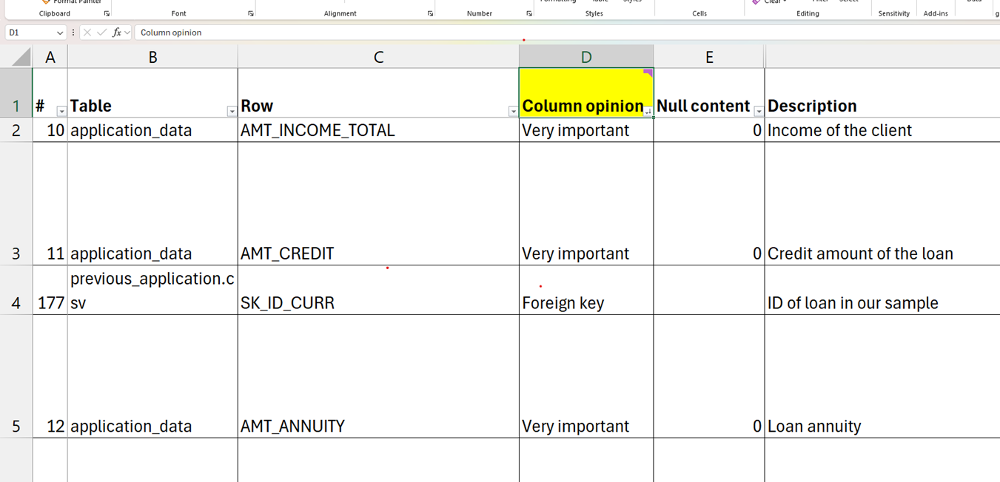




   based on understanding, inference was drawn and noted in subsequent columns for recalling later. here is the glimpse of analysis done .

   Based on assumption - a total of 42 columns are marked as "important" and "Very important" . this is a hypothesis at the moment and needs to be verified from data

*Step 4*

**Analyzing app_data columns first**

Parameters to check : 

    How many null values ? 
    does column have any unexpected entry ? Definition of unexpected would be different for each column
    what inference could be drawn from column ? 
    Finally - what could be done with this column ?

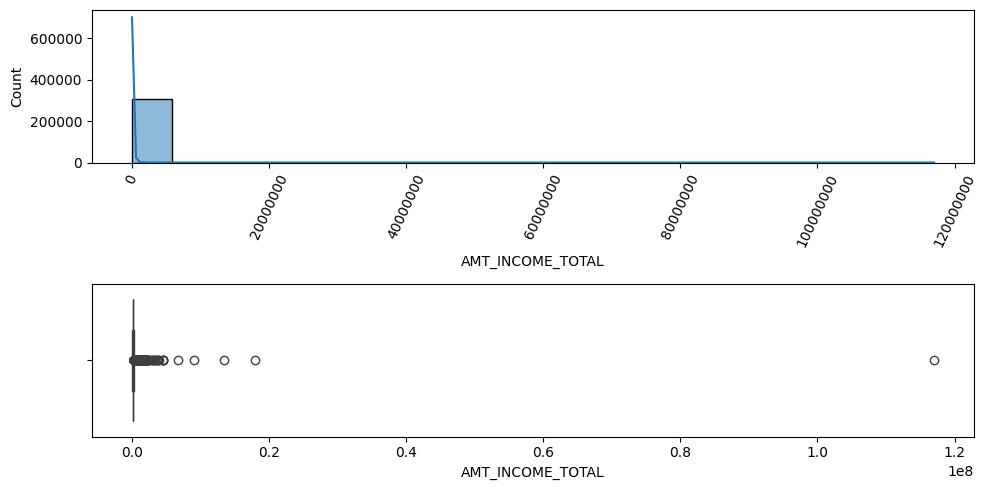

In [393]:
# AMT_INCOME_TOTAL
plotter_hist_box(app_data, 'AMT_INCOME_TOTAL')

Inference : AMT_INCOME_TOTAL 
null values : 0

Quantile info:
0.25    112500.0
0.75    202500.0

income ranges outside the upper outlier limit can be ignored for usual analysis. 

Decision : to be further correlated with other parameters,but ***outliers needs to be isolated*** 


In [394]:
clean_outliers(app_data, 5, 'AMT_INCOME_TOTAL')

Outliers cleaning successful


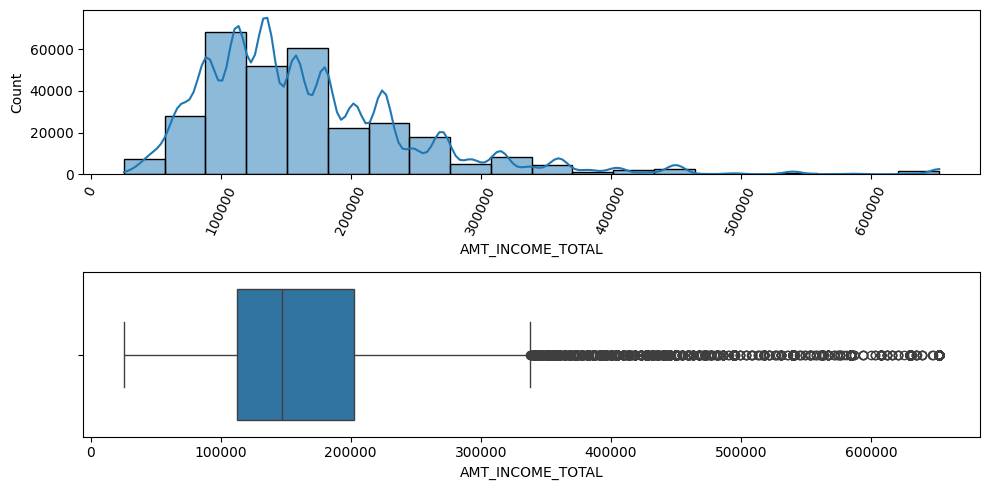

In [395]:
# AMT_INCOME_TOTAL
plotter_hist_box(app_data, 'AMT_INCOME_TOTAL')

Inference : income ranges in a decent range of 1 lakh to 6 lakh roughly after getting rid of the outliers
data is still skewed right with most of the income ranging between 1 to 2 lakh.

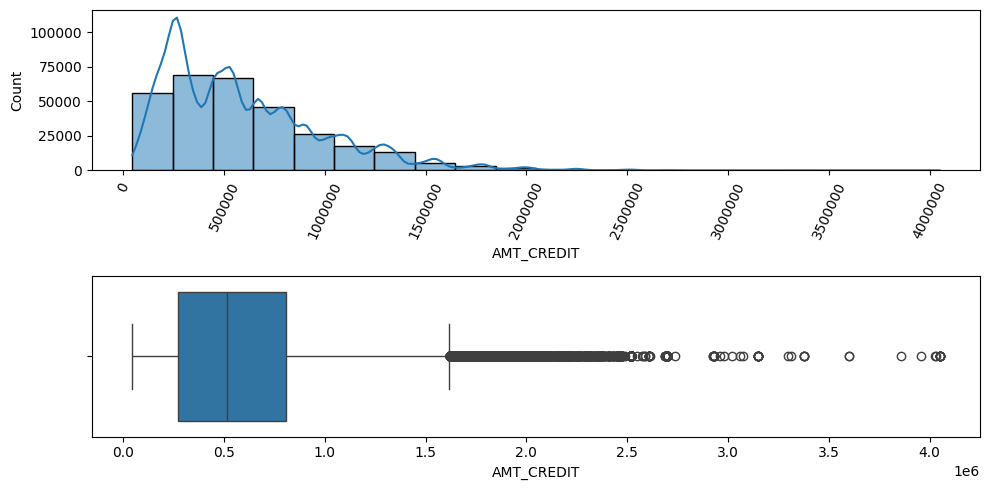

In [396]:
# AMT_CREDIT
plotter_hist_box(app_data, 'AMT_CREDIT')

In [397]:
clean_outliers(app_data, 1.5, 'AMT_CREDIT')

Outliers cleaning successful


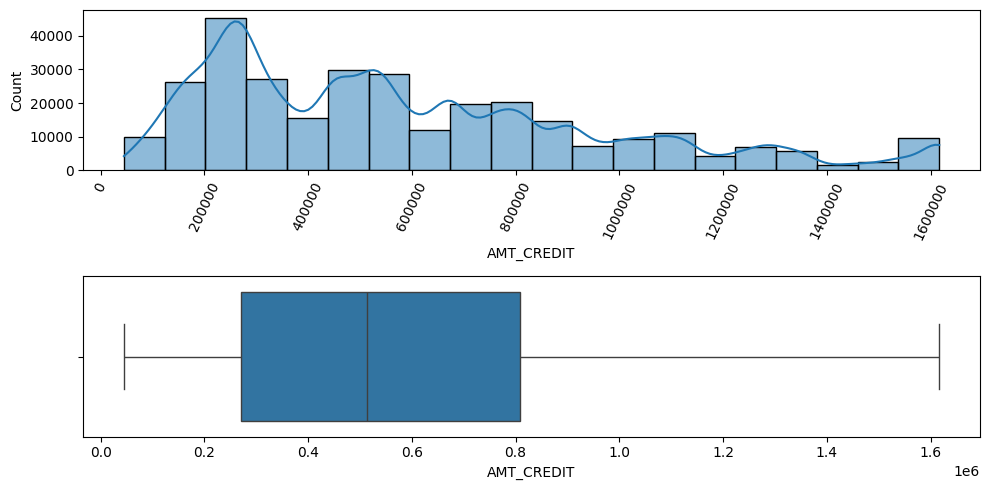

In [398]:
plotter_hist_box(app_data, 'AMT_CREDIT')

credit mostly ranges from 0 to 16 lakhs. Outliers cleaned 
    Next : Use to analyse in merge

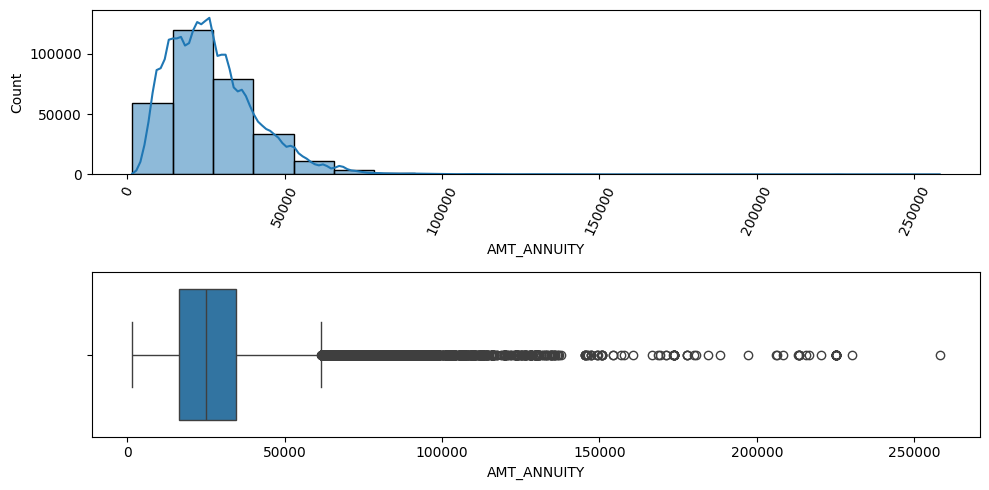

In [399]:
# AMT_ANNUITY
plotter_hist_box(app_data, 'AMT_ANNUITY')

In [400]:
clean_outliers(app_data, 2, 'AMT_ANNUITY')

Outliers cleaning successful


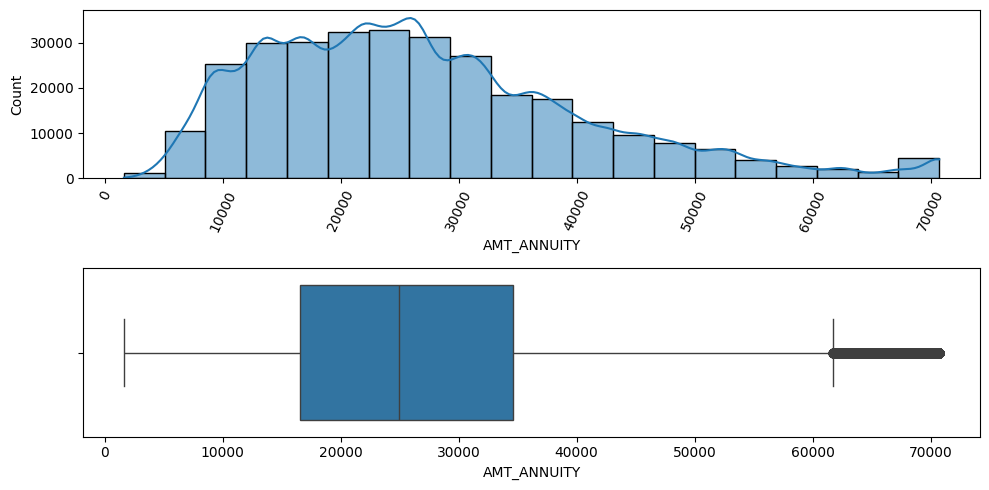

In [401]:
plotter_hist_box(app_data, 'AMT_ANNUITY')

Annuity ranges up to 70000 now. right skewed data.

3rd quartile is 3.45 lakh. Mostly ranges below 1 lakh
25 and 75 percentile ranges:
        0.25    16524.0
        0.75    34596.0




In [402]:
# NAME_INCOME_TYPE

checknull(app_data, 'NAME_INCOME_TYPE')

0

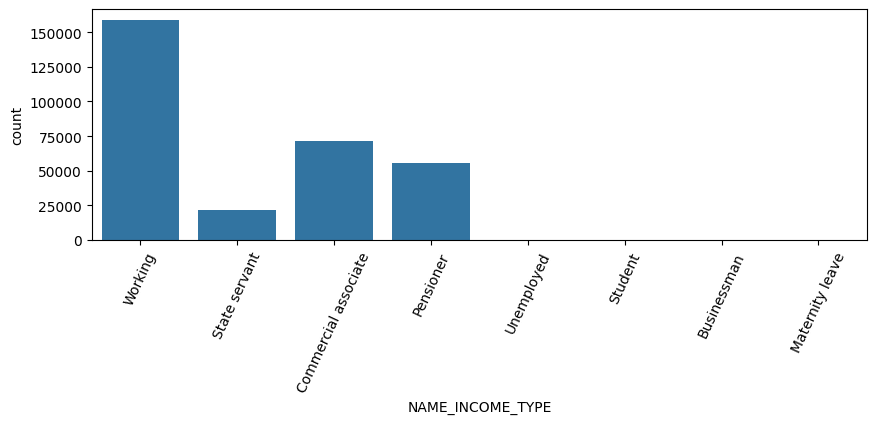

In [403]:
# starting plot as no nulls available
plot_count(app_data, 'NAME_INCOME_TYPE')

inference : 
categorical information. 4 categories are significant. Largest : WOrking 


Next : see correlation with payment difficulties

In [404]:
# OCCUPATION_TYPE
checknull(app_data, 'OCCUPATION_TYPE')

96391

In [405]:
# clean the null values as too many nulls are available. replace with most recurring value

temp_df = app_data['OCCUPATION_TYPE'].value_counts().reset_index()

val = temp_df.iloc[[0],[0]]

cleannull(app_data,  'OCCUPATION_TYPE', 'Laborers')

C:\Users\vinay\AppData\Local\Temp\ipykernel_40800\424053217.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(val, inplace=True)


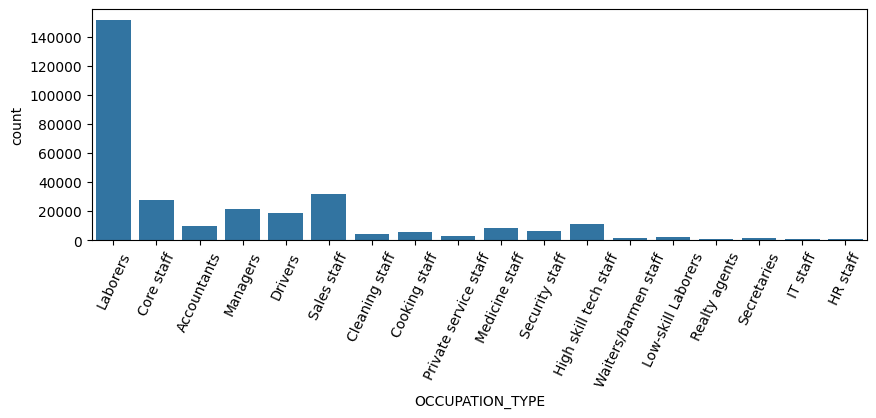

In [406]:
plot_count(app_data, 'OCCUPATION_TYPE')

Inference : Labourers are the most common applicants followed by Sales Staff.(though this data is also influenced with null replacements. still Labourers were the largest of applicants)

In [407]:
# NAME_EDUCATION_TYPE
checknull(app_data, 'NAME_EDUCATION_TYPE')

0

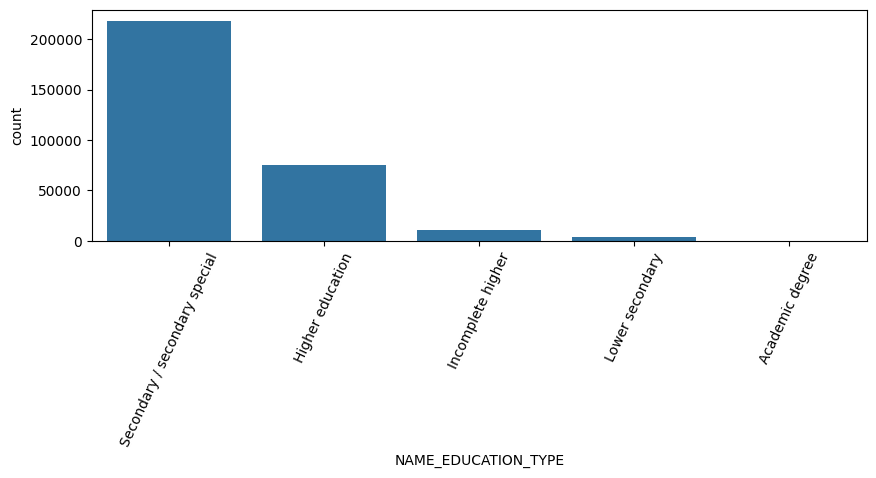

In [408]:
# No nulls. start plotting
plot_count(app_data, 'NAME_EDUCATION_TYPE')

Inference : Categorical data . secondary and higher education applicants constitute more than 80% of the total applications. 

Next : see correlation with payment difficulties

In [409]:
# NAME_FAMILY_STATUS
checknull(app_data, 'NAME_FAMILY_STATUS')

0

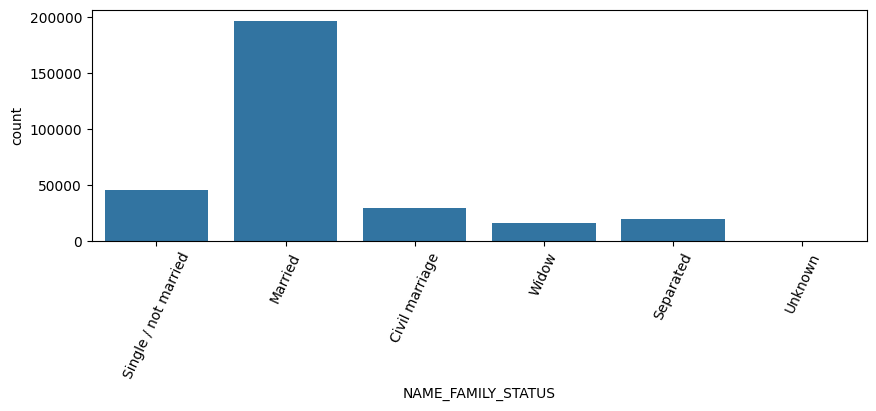

In [410]:
# No Nulls - plot the column

plot_count(app_data, 'NAME_FAMILY_STATUS')


     NAME_FAMILY_STATUS   count  category_percentage
0               Married  196432                 63.9
1  Single / not married   45444                 14.8
2        Civil marriage   29775                  9.7
3             Separated   19770                  6.4
4                 Widow   16088                  5.2
5               Unknown       2                  0.0


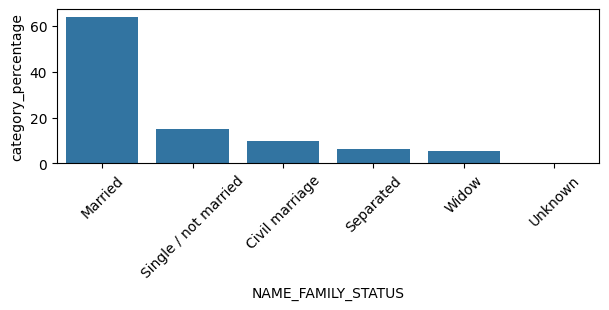

In [411]:
# lets check the family status categories percentage
family_status = app_data['NAME_FAMILY_STATUS'].value_counts().reset_index().sort_values(by='count', ascending=False)



family_status['category_percentage']= round(family_status['count']*100/family_status['count'].sum() ,1)
print(family_status)
plt.figure(figsize=(7,2))
sns.barplot(data=family_status, x='NAME_FAMILY_STATUS', y='category_percentage')
plt.xticks(rotation=45)
plt.show()

Inference : Categorical data. clear inference can be drawn out. 

Married applicants are nearly 64%
followed by single / not married

Next : check correlation with payment difficulties after merge



In [412]:
# NAME_HOUSING_TYPE
checknull(app_data, 'NAME_HOUSING_TYPE')

0

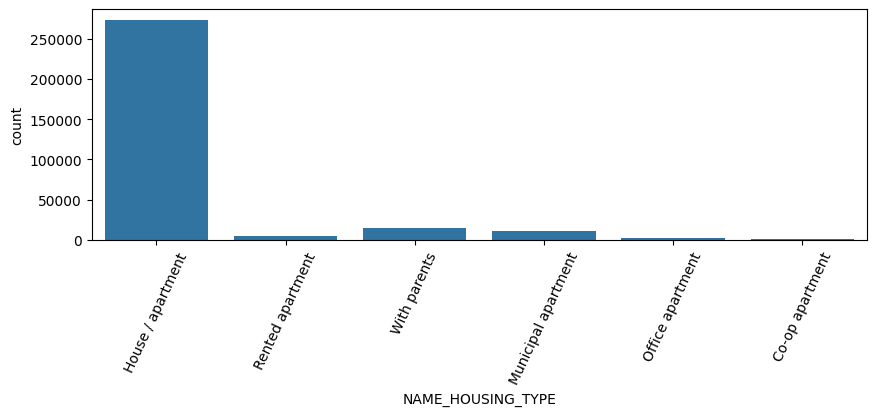

In [413]:
# No Null- plot
plot_count(app_data,'NAME_HOUSING_TYPE')

Inference : Clean data with no nulls
Clearly vast majority of applicants have their own house / apartment. 

Next : segmentation with this column may be difficult as it is heavily biased in 1 category. 

**ANALYSING TIME PERIOD COLUMNS**

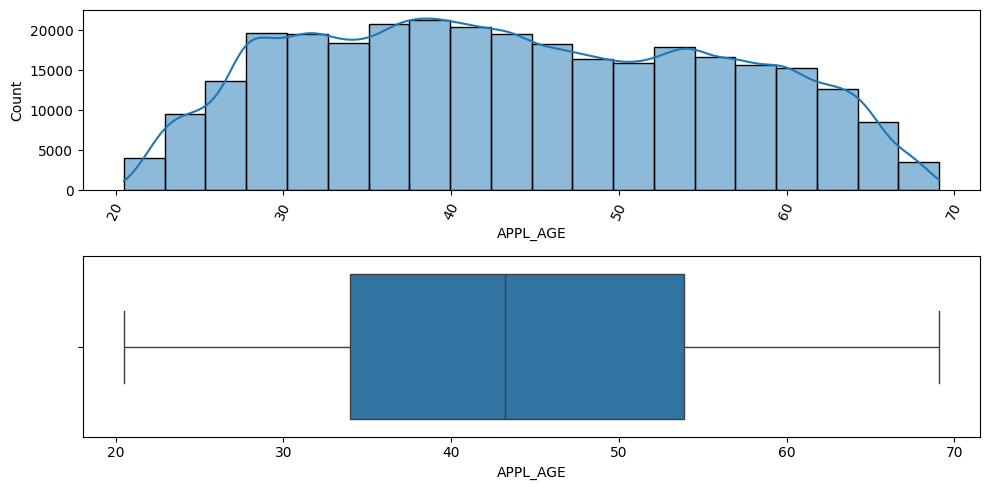

0.25    34.0
0.75    53.9
Name: APPL_AGE, dtype: float64

In [414]:
# DAYS_BIRTH
# converting this to age of individual applicant

app_data['APPL_AGE']= round(app_data['DAYS_BIRTH']*-1/365, 1)

# afterthis , the column 'DAYS_BIRTH' will be discarded as age is extracted from this column. 
plotter_hist_box(app_data,'APPL_AGE')

app_data['APPL_AGE'].quantile((0.25,0.75))

Inference : Age of applicants vary from 20 to 70. 

Next : correlate how age impacts chances of payment difficulties

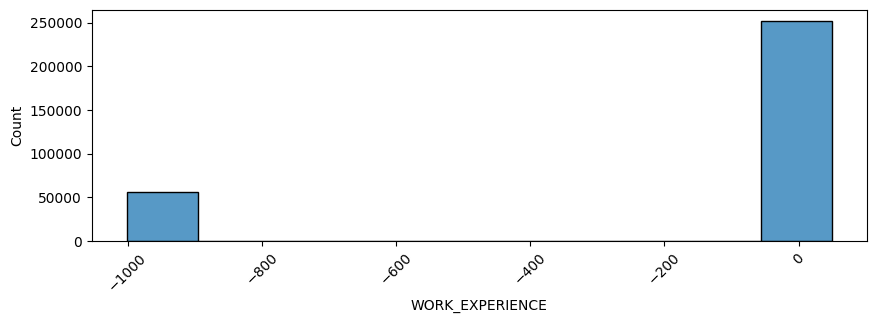

55374
count of wrong entries of expereince: 18.0


In [415]:
# DAYS_EMPLOYED
# converting this to age of individual applicant

app_data['WORK_EXPERIENCE']= round(app_data['DAYS_EMPLOYED']*-1/365, 1)

# afterthis , the column 'DAYS_EMPLOYED' will be discarded as age is extracted from this column. 

app_data['WORK_EXPERIENCE']

plt.figure(figsize=(10,3))
plt.ticklabel_format(style='plain')
sns.histplot(data=app_data, x='WORK_EXPERIENCE', bins=10)
plt.xticks(rotation = 45)
plt.show()


app_data['WORK_EXPERIENCE'].quantile((0.25,0.75))

print(app_data['WORK_EXPERIENCE'][app_data['WORK_EXPERIENCE']<0].count())

print(f"count of wrong entries of expereince: {round(app_data['WORK_EXPERIENCE'][app_data['WORK_EXPERIENCE']<0].count() *100 /app_data['WORK_EXPERIENCE'].count(),1)}")


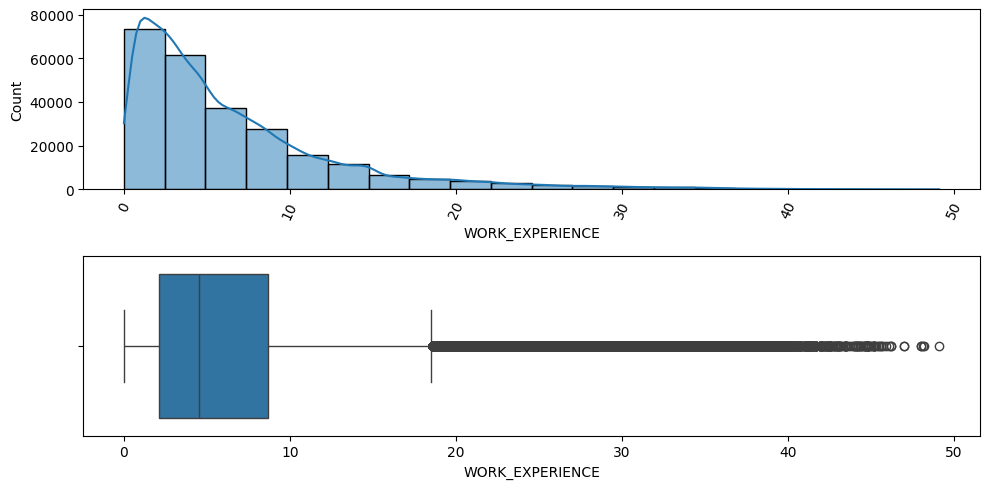

In [416]:
# try plotting the work exp without wrong entries to get idea about how data would look
app_data_wrkexp = app_data[app_data['WORK_EXPERIENCE']>=0]

plotter_hist_box(app_data_wrkexp, 'WORK_EXPERIENCE')

<Axes: xlabel='WORK_EXPERIENCE'>

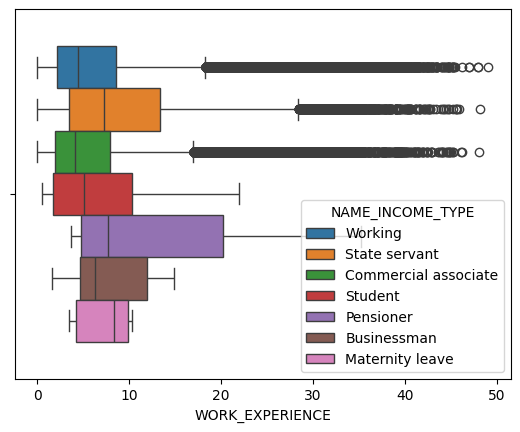

In [417]:
# boxplot data isn't clear enough. use hue  with income type to see inferences

sns.boxplot(app_data_wrkexp, x='WORK_EXPERIENCE', hue='NAME_INCOME_TYPE')

<Axes: xlabel='APPL_AGE', ylabel='WORK_EXPERIENCE'>

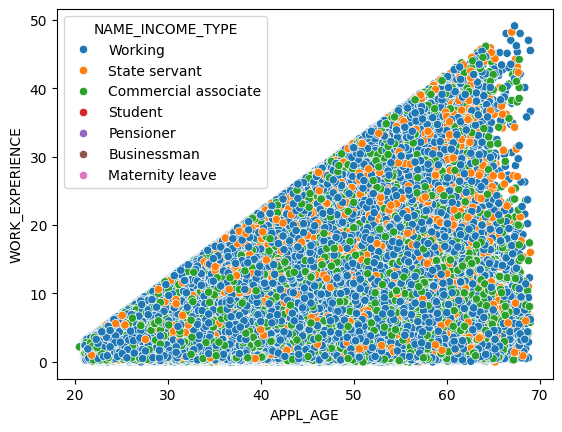

In [418]:
sns.scatterplot(app_data_wrkexp, x='APPL_AGE', y='WORK_EXPERIENCE', hue='NAME_INCOME_TYPE')

In [419]:
# cleaning work_exp since wrong entries make no sense

app_data['WORK_EXPERIENCE'][app_data['WORK_EXPERIENCE']<0]=0
app_data['WORK_EXPERIENCE'].quantile((0.25,0.5,0.75))


C:\Users\vinay\AppData\Local\Temp\ipykernel_40800\3494870485.py:3: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  app_data['WORK_EXPERIENCE'][app_data['WORK_EXPERIENCE']<0]=0
C:\Users\vinay\AppData\Local\Temp\ipykernel_40800\3494870485.py:3: 

0.25    0.8
0.50    3.3
0.75    7.6
Name: WORK_EXPERIENCE, dtype: float64

**Inference :** about 18% entries  are wrong and need cleaning. 
considering only genuine values , experience ranges from 0 to 40 . with obvious reasons, this should have a positive relation with applicant's age. However, there are many who are on higher age bracket but do not possess work expereience.this may include those who are not in working professions. 

Age - Expr. is not making any proper correlation .. too many outliers. 

Next  : replace wrong values with 0 so that  it does not affect the correlation  of those applicants who are  employed with some experience.. 
        Just once check if there's any pattern coming out with TARGET . if not, simply drop this column from analysis as it has too many outliers across all Income types.

**Will remove the wrong values and unwanted columns "DAYS_EMPLOYED" & "DAYS_BIRTH".**

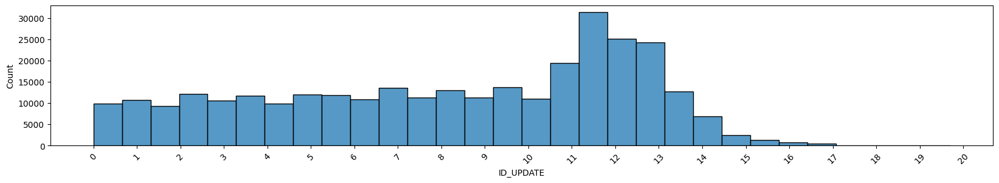

0.25     4.7
0.75    11.8
Name: ID_UPDATE, dtype: float64

In [420]:
# DAYS_ID_PUBLISH
# converting this to age of individual applicant
# app_data['']
app_data['ID_UPDATE']= round(app_data['DAYS_ID_PUBLISH']*-1/365, 1)

# afterthis , the column 'DAYS_ID_PUBLISH' will be discarded as age is extracted from this column. 

app_data['ID_UPDATE']

plt.figure(figsize=(20,3))
plt.ticklabel_format(style='plain')
sns.histplot(data=app_data, x='ID_UPDATE', bins=30)
plt.xticks(rotation = 45)
plt.gca().xaxis.set_major_locator(ticker.MultipleLocator(1))
plt.show()


app_data['ID_UPDATE'].quantile((0.25,0.75))


Inference : There are people who have updated their documents in less than 6 monhs.. i would be interested in those cases because there may lie the potential fraud cases.

Next :  1 remove the 'DAYS_ID_PUBLISH' column as its purpose is solved 
        2. lets replace all others with NaN as their reason to update their ID docs are not influenced with the objective of loan. 
        

In [421]:
app_data['ID_UPDATE'][app_data['ID_UPDATE']>0.5].count()

# There are 298998 genuine cases..to be replaced with NaN so that they do not get considered in the analysis.

np.int64(298998)

In [422]:
# app_data['ID_UPDATE'][app_data['ID_UPDATE']>0.5]= np.nan

# KEEPING DECISION TO SEGMENT IT PENDING UNTIL MERGE. IF REQUIRED, WILL DO THIS SEGMENTATION AFTER LOOKING AT FIRST CUT ANALYSIS

Outcome : the column ID_UPDATE now has entries with those who have updated the ID in less than 6 months. 

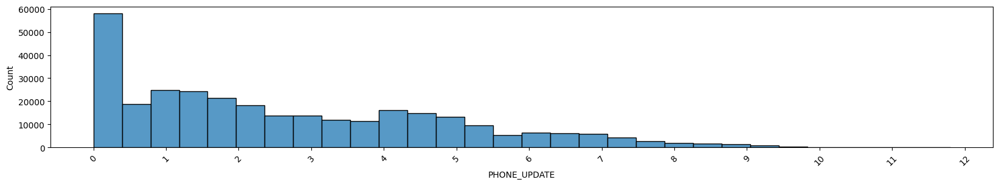

0.25    0.8
0.75    4.3
Name: PHONE_UPDATE, dtype: float64

In [423]:
# DAYS_LAST_PHONE_CHANGE

# app_data['DAYS_LAST_PHONE_CHANGE']

app_data['PHONE_UPDATE']= round(app_data['DAYS_LAST_PHONE_CHANGE']*-1/365, 1)

# afterthis , the column 'DAYS_LAST_PHONE_CHANGE' will be discarded as age is extracted from this column. 

app_data['PHONE_UPDATE']

plt.figure(figsize=(20,3))
plt.ticklabel_format(style='plain')
sns.histplot(data=app_data, x='PHONE_UPDATE', bins=30)
plt.xticks(rotation = 45)
plt.gca().xaxis.set_major_locator(ticker.MultipleLocator(1))
plt.show()


app_data['PHONE_UPDATE'].quantile((0.25,0.75))

those who have updated their nummbers in less than 6 months may have potential defaulters or frauds. 

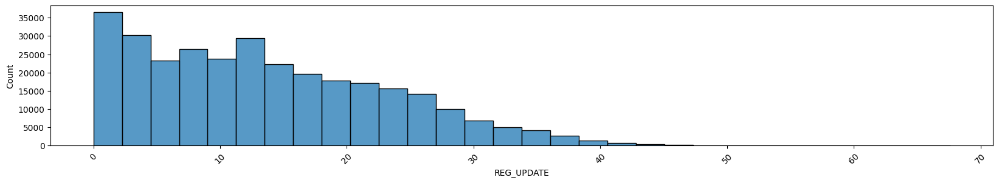

0.25     5.5
0.75    20.5
Name: REG_UPDATE, dtype: float64

In [424]:
# DAYS_REGISTRATION
app_data['REG_UPDATE']= round(app_data['DAYS_REGISTRATION']*-1/365, 1)

# afterthis , the column 'DAYS_REGISTRATION' will be discarded as age is extracted from this column. 

app_data['REG_UPDATE']

plt.figure(figsize=(20,3))
plt.ticklabel_format(style='plain')
sns.histplot(data=app_data, x='REG_UPDATE', bins=30)
plt.xticks(rotation = 45)

plt.show()


app_data['REG_UPDATE'].quantile((0.25,0.75))


Inference : range is extremelty widespread.. however , i'm not sure of the meaning of registration change. can correlate about how its behavior shows w.r.t. TARGET and other parameters

In [425]:
# Dropping all irrelevant columns now together

app_data = app_data.drop(columns={'DAYS_ID_PUBLISH', 'DAYS_LAST_PHONE_CHANGE','DAYS_REGISTRATION','DAYS_EMPLOYED','DAYS_BIRTH'})


In [426]:
# ORGANIZATION_TYPE
checknull(app_data, 'ORGANIZATION_TYPE')

0

0


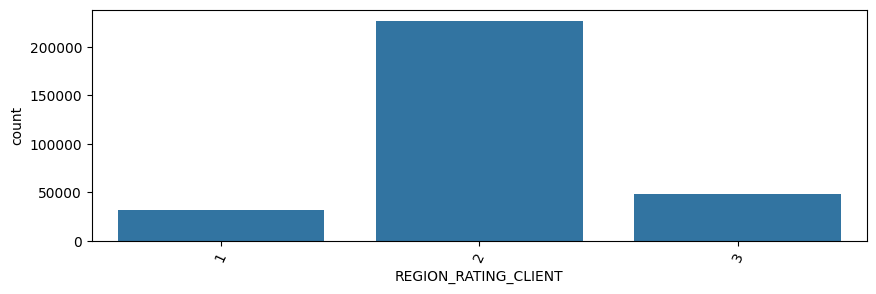

In [427]:
# REGION_RATING_CLIENT

print(checknull(app_data, 'REGION_RATING_CLIENT'))
plot_count(app_data, 'REGION_RATING_CLIENT')

[2 1 3]
0


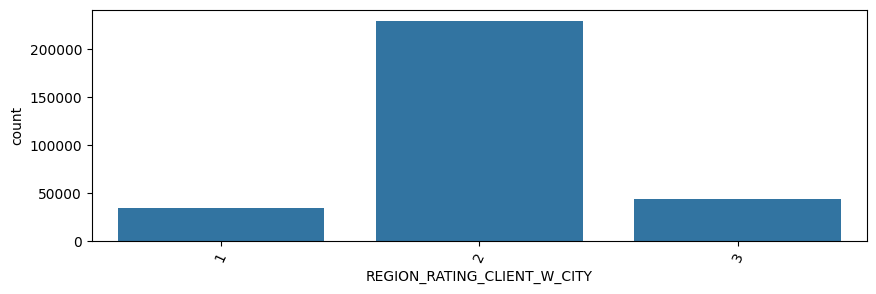

In [428]:
# REGION_RATING_CLIENT_W_CITY
print(app_data['REGION_RATING_CLIENT_W_CITY'].unique())
print(checknull(app_data, 'REGION_RATING_CLIENT_W_CITY'))

plot_count(app_data, 'REGION_RATING_CLIENT_W_CITY')

**Inference : most of applicants are living in  Rating 2 of region as well as City.** 

278


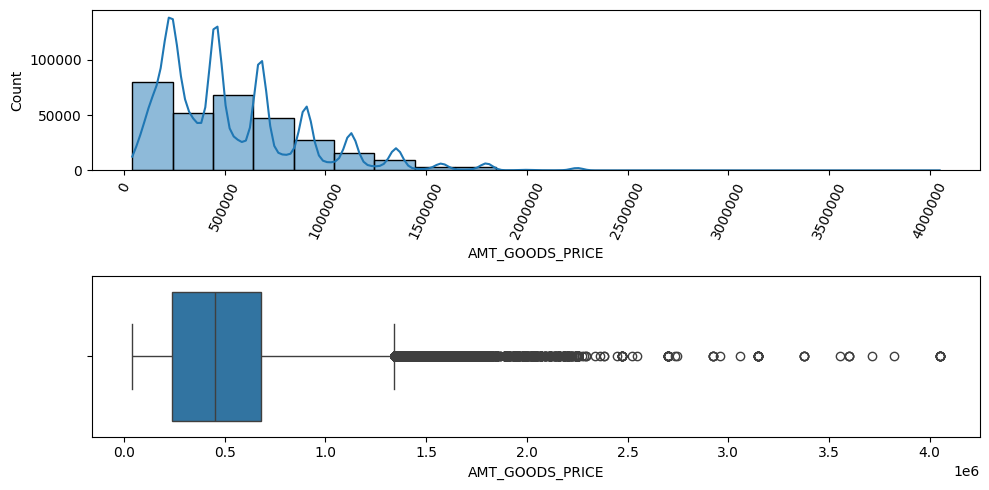

In [429]:
# AMT_GOODS_PRICE
print(checknull(app_data, 'AMT_GOODS_PRICE'))
# there are some nulls in it. lets see the data patten before deciding how to clean

plotter_hist_box(app_data, 'AMT_GOODS_PRICE')


In [430]:
# there is a very large range of outliers. lets clean with a factor of 5

clean_outliers(app_data, 5, 'AMT_GOODS_PRICE')

Outliers cleaning successful


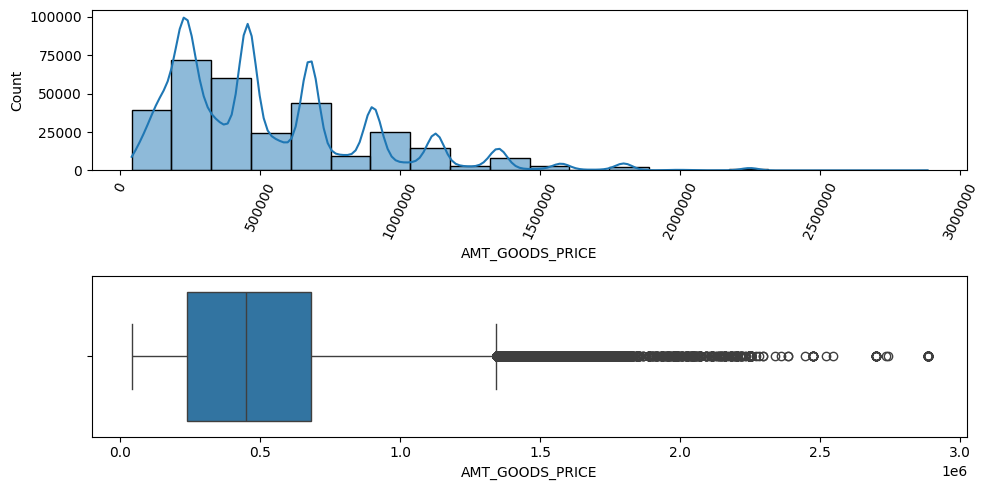

In [431]:
plotter_hist_box(app_data, 'AMT_GOODS_PRICE')

**Goods being bought range as high as 25 Lakh !!! **

keeping some outliers intentionally in data


In [432]:
# AMT_REQ_CREDIT_BUREAU_DAY

print(app_data['AMT_REQ_CREDIT_BUREAU_DAY'].unique())
print(checknull(app_data, 'AMT_REQ_CREDIT_BUREAU_DAY'))
# it is categorical data with a lot of nulls.
app_data['AMT_REQ_CREDIT_BUREAU_DAY'].value_counts()

[ 0. nan  1.  3.  2.  4.  5.  6.  9.  8.]
41519


AMT_REQ_CREDIT_BUREAU_DAY
0.0    264503
1.0      1292
2.0       106
3.0        45
4.0        26
5.0         9
6.0         8
9.0         2
8.0         1
Name: count, dtype: int64

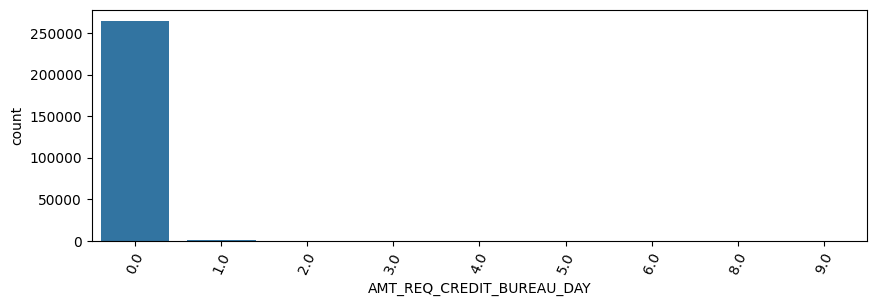

In [433]:
plot_count(app_data, 'AMT_REQ_CREDIT_BUREAU_DAY')

In [434]:
# Fill Nulls with 0 as that's the most common case.

cleannull(app_data, 'AMT_REQ_CREDIT_BUREAU_DAY',0)

C:\Users\vinay\AppData\Local\Temp\ipykernel_40800\424053217.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(val, inplace=True)


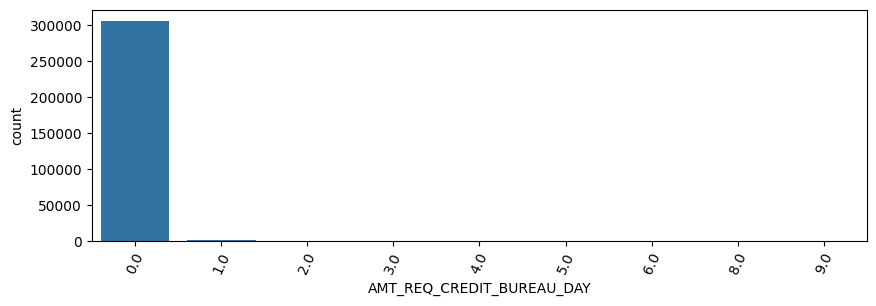

In [435]:
plot_count(app_data,'AMT_REQ_CREDIT_BUREAU_DAY')

Not much difference.. count of 0 has increased due to null cleaning.

In [436]:
# AMT_REQ_CREDIT_BUREAU_HOUR
print(app_data['AMT_REQ_CREDIT_BUREAU_HOUR'].unique())
print(checknull(app_data, 'AMT_REQ_CREDIT_BUREAU_HOUR'))
# it is categorical data with a lot of nulls.
app_data['AMT_REQ_CREDIT_BUREAU_HOUR'].value_counts()
cleannull(app_data,'AMT_REQ_CREDIT_BUREAU_HOUR',0)

[ 0. nan  1.  2.  3.  4.]
41519


C:\Users\vinay\AppData\Local\Temp\ipykernel_40800\424053217.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(val, inplace=True)


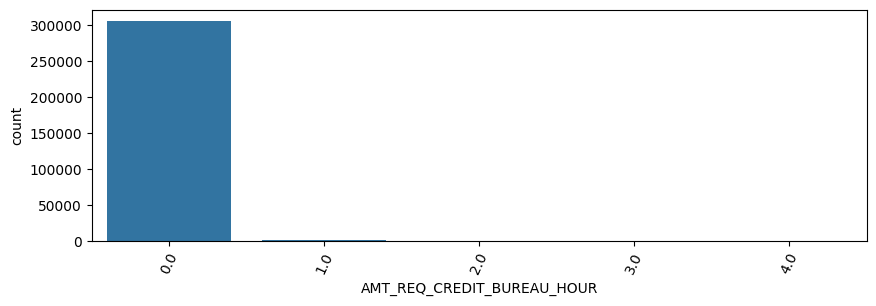

In [437]:
plot_count(app_data,'AMT_REQ_CREDIT_BUREAU_HOUR')

In [438]:
# AMT_REQ_CREDIT_BUREAU_WEEK

print(app_data['AMT_REQ_CREDIT_BUREAU_WEEK'].unique())
print(checknull(app_data, 'AMT_REQ_CREDIT_BUREAU_WEEK'))
# it is categorical data with a lot of nulls.replace nulls with maximum recurring value.
app_data['AMT_REQ_CREDIT_BUREAU_WEEK'].value_counts()
cleannull(app_data,'AMT_REQ_CREDIT_BUREAU_WEEK',0)

[ 0. nan  1.  3.  2.  4.  5.  6.  8.  7.]
41519


C:\Users\vinay\AppData\Local\Temp\ipykernel_40800\424053217.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(val, inplace=True)


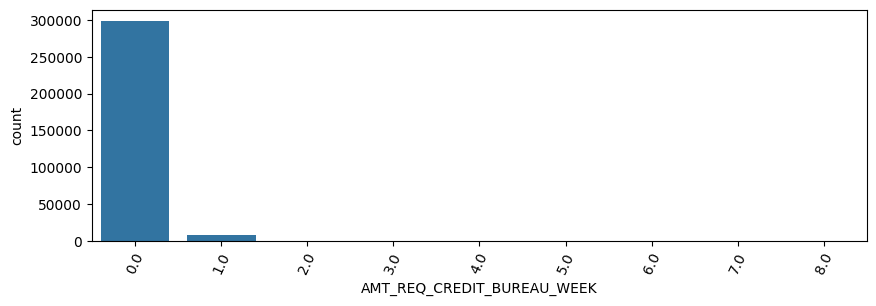

In [439]:
plot_count(app_data,'AMT_REQ_CREDIT_BUREAU_WEEK')

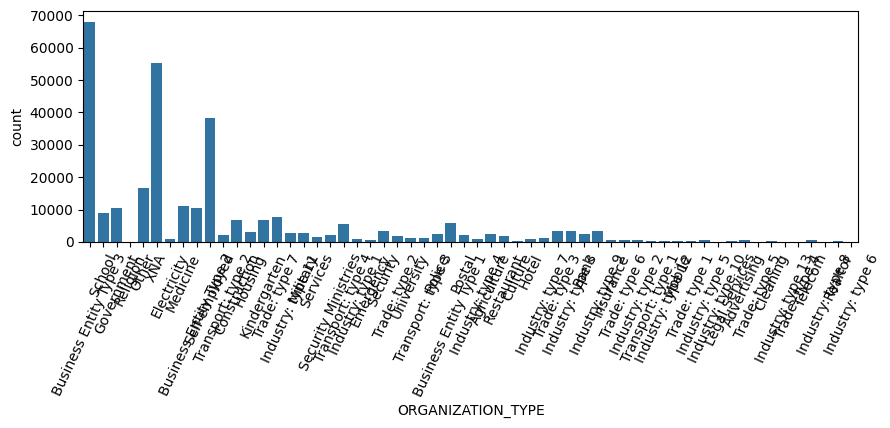

In [440]:
# plot ORGANIZATION_TYPE

plot_count(app_data, 'ORGANIZATION_TYPE')

Inference  : although it is a categorical information, yet the category types are too many. if these categories can be put into certain groups and reduced, it may be useful. for now, it seems a bit difficult to analyse. 

next : to be re-looked after merge

**Checking Previous Application columns**

begin as usual by checking if any cols have too many nulls

In [441]:
# Read Prev applicaitons data as "prev_data"
prev_data = pd.read_csv('previous_application.csv')

In [442]:
prev_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [443]:
prev_data_copy = prev_data.copy()

In [444]:
# Identify cols with 50% or more Null values

null_prevdata = prev_data.isnull().sum().reset_index()

null_prevdata = null_prevdata.rename(columns={'index':'colname', 0:'null_count'})

# app_data['SK_ID_CURR'].count()
null_prevdata['null_%'] = round(null_prevdata['null_count'] *100/prev_data['SK_ID_CURR'].count(),1)

null_prevdata.sort_values(by='null_%', ascending=False)


drop_prevdata = null_prevdata[null_prevdata['null_%']>=50]

# put such cols in a list to be used in dropping from app_data
drop_list = []
for cols in drop_prevdata['colname']:
    # print(cols)
    drop_list.append(cols)

# Drop the cols mentioned in the list of cols to be dropped 
prev_data = prev_data.drop(columns=drop_list)
prev_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 33 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_GOODS_PRICE              1284699 non-null  float64
 7   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 8   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 9   FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 10  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 11  NAME_CASH_LOAN_PURPOSE       1670214 non-null  object 
 12  NAME_CONTRACT_STATUS         1670214 non-n

**4 columns  that had too many nulls have been  dropped.**

Now prev_data has 33 columns that can be analysed further

In [445]:
# AMT_ANNUITY

checknull(prev_data,'AMT_ANNUITY')


372235

In [446]:
# replace nulls with Median value

cleannull(prev_data,'AMT_ANNUITY', float(prev_data['AMT_ANNUITY'].median()))

C:\Users\vinay\AppData\Local\Temp\ipykernel_40800\424053217.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(val, inplace=True)


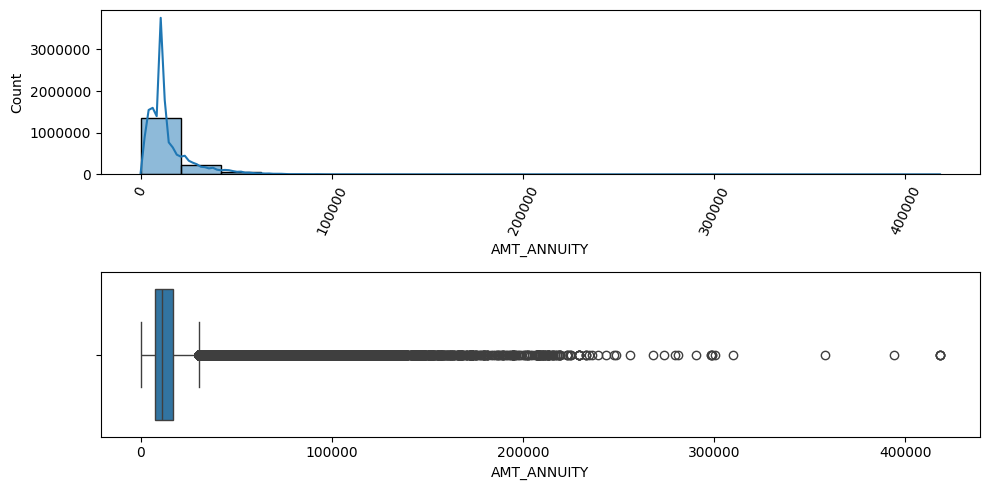

0.25     7547.09625
0.50    11250.00000
0.75    16824.02625
Name: AMT_ANNUITY, dtype: float64

In [447]:
# AMT_ANNUITY

plotter_hist_box(prev_data,'AMT_ANNUITY')
prev_data['AMT_ANNUITY'].quantile((0.25,0.5,0.75))


Inference : Cleaned nearly 3.72lakh  Null records by replacing them with median value. 
 
*Overall range of Annuity is below 1 lakh*

*Median : 11250*

*Next : Clean the outliers*


In [448]:
# Clean the outliers 
clean_outliers(prev_data, 5, 'AMT_ANNUITY')


Outliers cleaning successful


In [449]:
# NAME_CLIENT_TYPE
checknull(prev_data, 'NAME_CLIENT_TYPE')

0

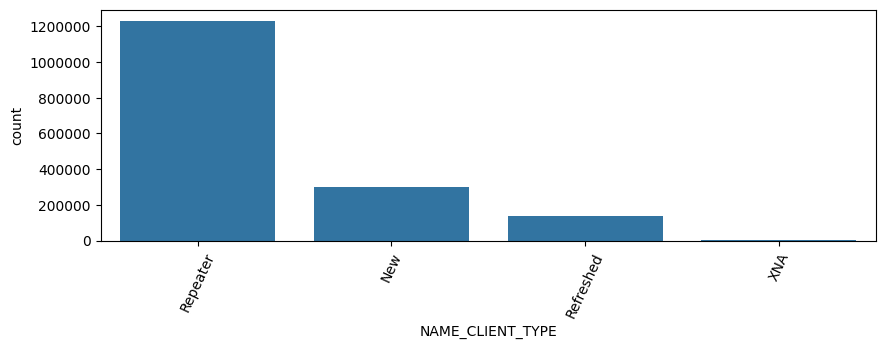

In [450]:
plot_count(prev_data, 'NAME_CLIENT_TYPE')

In [451]:
# NAME_YIELD_GROUP
checknull(prev_data, 'NAME_YIELD_GROUP')

0

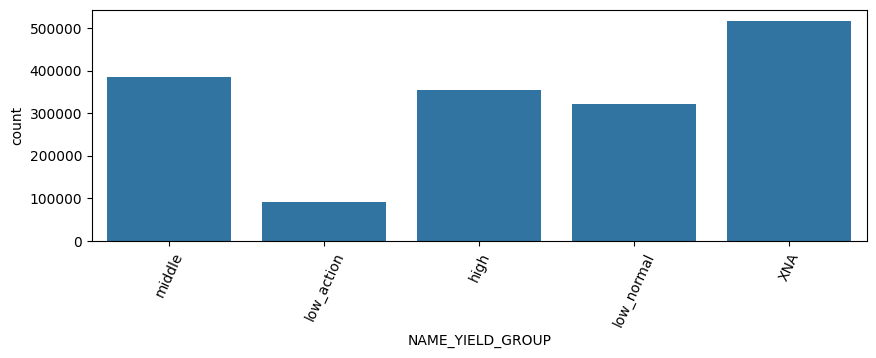

In [452]:
plot_count(prev_data, 'NAME_YIELD_GROUP')

  NAME_YIELD_GROUP   count  count%
0              XNA  517215    31.0
1           middle  385532    23.1
2             high  353331    21.2
3       low_normal  322095    19.3
4       low_action   92041     5.5


<Axes: xlabel='NAME_YIELD_GROUP', ylabel='count%'>

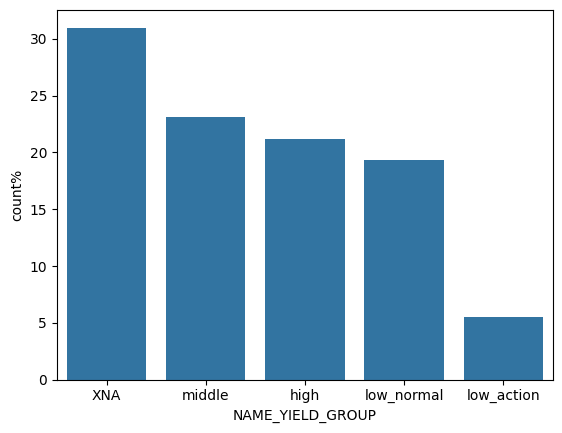

In [453]:
# check group wise percentage
intgroup_per = prev_data['NAME_YIELD_GROUP'].value_counts().reset_index()

intgroup_per['count%']= round(intgroup_per['count']*100/ intgroup_per['count'].sum(),1)

print(intgroup_per)

sns.barplot(data=intgroup_per, x='NAME_YIELD_GROUP', y='count%')

inference : XNA (?) and middle  contribute to >50% of prev_app  cases
Next : correlate with Target


In [454]:
# CNT_PAYMENT
checknull(prev_data,'CNT_PAYMENT')

372230

In [455]:
# too many nulls. replace with median

cleannull(prev_data,'CNT_PAYMENT',float(prev_data['CNT_PAYMENT'].median()))

C:\Users\vinay\AppData\Local\Temp\ipykernel_40800\424053217.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(val, inplace=True)


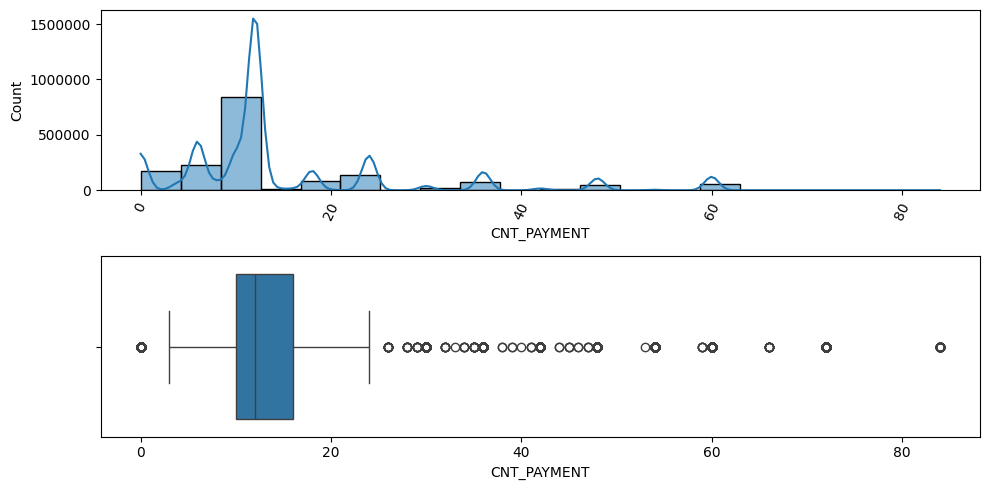

In [456]:
# CNT_PAYMENT

plotter_hist_box(prev_data, 'CNT_PAYMENT')

# sns.histplot(prev_data, x='CNT_PAYMENT', bins=10)

In [457]:
prev_data['CNT_PAYMENT'].quantile((0.25,0.5,0.75))

0.25    10.0
0.50    12.0
0.75    16.0
Name: CNT_PAYMENT, dtype: float64

inference : meaning of the column not clear. Histogram shows a pattern of terms containing in specific buckets but not clear. 

Next : run a correlation with Target and drop column if no relation appears. 

*Step 5*

In [458]:
# Merging the two dataframes for further usage. until this point, no segmentation is applied. 
# This is merging of 2 raw data as received.

common_df = pd.merge(app_data, prev_data, on='SK_ID_CURR', how='left')

common_df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0
3,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Consumer electronics,12.0,middle,POS household with interest,365243.0,-2310.0,-1980.0,-1980.0,-1976.0,1.0
4,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,Connectivity,4.0,middle,POS mobile without interest,365243.0,-784.0,-694.0,-724.0,-714.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1430150,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,XNA,24.0,middle,Cash X-Sell: middle,365243.0,-618.0,72.0,-558.0,-528.0,1.0
1430151,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,Connectivity,0.0,XNA,Card Street,NaN,NaN,NaN,NaN,NaN,NaN
1430152,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,XNA,60.0,low_normal,Cash Street: low,NaN,NaN,NaN,NaN,NaN,NaN
1430153,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,XNA,36.0,low_normal,Cash X-Sell: low,365243.0,-756.0,294.0,-66.0,-64.0,0.0


In [459]:
common_df.iloc[:,1:100].info()
common_df.iloc[:,100:].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1430155 entries, 0 to 1430154
Data columns (total 99 columns):
 #   Column                        Non-Null Count    Dtype  
---  ------                        --------------    -----  
 0   TARGET                        1430155 non-null  int64  
 1   NAME_CONTRACT_TYPE_x          1430155 non-null  object 
 2   CODE_GENDER                   1430155 non-null  object 
 3   FLAG_OWN_CAR                  1430155 non-null  object 
 4   FLAG_OWN_REALTY               1430155 non-null  object 
 5   CNT_CHILDREN                  1430155 non-null  int64  
 6   AMT_INCOME_TOTAL              1430155 non-null  float64
 7   AMT_CREDIT_x                  1430155 non-null  float64
 8   AMT_ANNUITY_x                 1430062 non-null  float64
 9   AMT_GOODS_PRICE_x             1428936 non-null  float64
 10  NAME_TYPE_SUITE_x             1426124 non-null  object 
 11  NAME_INCOME_TYPE              1430155 non-null  object 
 12  NAME_EDUCATION_TYPE         

Understanding the  merged dataframe to check if any column could still be removed as per the analysis so far

In [460]:
print(f'total columns in merged column are :{common_df.shape[1]}')

total columns in merged column are :113


*Step 6*

In [461]:
#  Bringing all object values and numeric values separate in 2 separate dataframes to explore if the analysis can be easier when done exclusively for numeric / exclusively for object data. 
  

num_cols = []
str_cols = []
common_df_num = common_df.iloc[:,0:2]
common_df_str = common_df.iloc[:,0:2]

for cols in common_df.iloc[:,2:].columns:
    # print(common_df[cols].dtype)
    if common_df[cols].dtype == int or common_df[cols].dtype==float:
        # num_cols.append(cols)
        if cols not in common_df_num.columns:
            common_df_num[cols]=0
        common_df_num[cols]+=common_df[cols]

    else:
        # str_cols.append(cols)
        if cols not in common_df_num.columns:
            common_df_str[cols]=''
        common_df_str[cols]+=common_df[cols]




*Step 7*

In [462]:
# we have object columns in a common_df_str . however there may be too many values in some of them.
# to keep the plot simple, let us separate those columns which have too many unique values. keeping threshold at 10.
# will keep large columns separately to check them in a different list.

col_string = list(common_df_str.iloc[:,2:].columns)
large_cols = []
category_limit =10
for col in col_string:
    if len(common_df[col].unique()) >category_limit:
        col_string.remove(col)
        large_cols.append(col)

print(f'count of cols in category list : {len(col_string)} ; count of large columns : {len(large_cols)}')



count of cols in category list : 23 ; count of large columns : 6


In [463]:
# Since the object columns with too many unique values are not going to be analysed, we're dropping them from dataframe.
# This will keep the df simple
common_df.drop(columns=large_cols)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,...,CHANNEL_TYPE,SELLERPLACE_AREA,CNT_PAYMENT,NAME_YIELD_GROUP,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,Stone,500.0,24.0,low_normal,365243.0,-565.0,125.0,-25.0,-17.0,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Credit and cash offices,-1.0,12.0,low_normal,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Stone,1400.0,6.0,middle,365243.0,-797.0,-647.0,-647.0,-639.0,0.0
3,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Country-wide,200.0,12.0,middle,365243.0,-2310.0,-1980.0,-1980.0,-1976.0,1.0
4,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,Regional / Local,30.0,4.0,middle,365243.0,-784.0,-694.0,-724.0,-714.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1430150,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,Credit and cash offices,-1.0,24.0,middle,365243.0,-618.0,72.0,-558.0,-528.0,1.0
1430151,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,Country-wide,20.0,0.0,XNA,NaN,NaN,NaN,NaN,NaN,NaN
1430152,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,Credit and cash offices,-1.0,60.0,low_normal,NaN,NaN,NaN,NaN,NaN,NaN
1430153,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,AP+ (Cash loan),6.0,36.0,low_normal,365243.0,-756.0,294.0,-66.0,-64.0,0.0


***Null-Treatment in Categorical Columns***
*Now we know which columns are categorical in nature but there may be many null values in those columns. we need to clean them and to fill values , we'll use the traditional approach of "MODE" unless there are too many Nulls observed and clear cut selection is not easy. in such case, we'll drop the columns if necessary.*

In [464]:
# check  and clean the Nulls in all categorical columns of merged dataframe
null_list = []
for col in col_string:
    x= checknull(common_df, col)
    null_list.append(x)

len(null_list)

null_df = pd.Series(data=null_list, index=col_string).reset_index()

null_df= null_df.rename(columns={'index':'Column_name',0:'Null_count'})
null_df


,Column_name,Null_count
0,NAME_CONTRACT_TYPE_x,0
1,CODE_GENDER,0
2,FLAG_OWN_CAR,0
3,FLAG_OWN_REALTY,0
4,NAME_TYPE_SUITE_x,4031
5,NAME_INCOME_TYPE,0
6,NAME_EDUCATION_TYPE,0
7,NAME_FAMILY_STATUS,0
8,NAME_HOUSING_TYPE,0
9,WEEKDAY_APPR_PROCESS_START_x,0


In [465]:
null_df.sort_values(by='Null_count', ascending=True)

Null_columns = null_df[null_df['Null_count']>0].sort_values(by='Null_count', ascending=True)
Null_columns

,Column_name,Null_count
4,NAME_TYPE_SUITE_x,4031
11,NAME_CONTRACT_TYPE_y,16454
12,WEEKDAY_APPR_PROCESS_START_y,16454
13,FLAG_LAST_APPL_PER_CONTRACT,16454
15,NAME_PAYMENT_TYPE,16454
14,NAME_CONTRACT_STATUS,16454
16,CODE_REJECT_REASON,16454
18,NAME_CLIENT_TYPE,16454
22,NAME_YIELD_GROUP,16454
19,NAME_PORTFOLIO,16454


In [466]:
# Filling categorical colummn values with  Mode
for value in Null_columns.iloc[0:-2,:]['Column_name'].values:
    # print(value)
    # print(common_df[value].mode()[0])
    cleannull(common_df, value ,common_df[value].mode()[0] )

C:\Users\vinay\AppData\Local\Temp\ipykernel_40800\424053217.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(val, inplace=True)


In [467]:
# Treating last 2 columns differently as the null values are too much
Null_columns.iloc[-1:-3:-1,:]

# Null values are very high - very difficult to fill them with something.. hence removing these  2  columns  as well

common_df = common_df.drop(columns={'EMERGENCYSTATE_MODE', 'NAME_TYPE_SUITE_y'})
col_string.remove('EMERGENCYSTATE_MODE')
col_string.remove('NAME_TYPE_SUITE_y')

In [468]:
# Re-check Nulls in all categorical columns of merged dataframe
null_list = []
for col in col_string:
    x= checknull(common_df, col)
    null_list.append(x)

len(null_list)

null_df = pd.Series(data=null_list, index=col_string).reset_index()

null_df= null_df.rename(columns={'index':'Column_name',0:'Null_count'   })
null_df

,Column_name,Null_count
0,NAME_CONTRACT_TYPE_x,0
1,CODE_GENDER,0
2,FLAG_OWN_CAR,0
3,FLAG_OWN_REALTY,0
4,NAME_TYPE_SUITE_x,0
5,NAME_INCOME_TYPE,0
6,NAME_EDUCATION_TYPE,0
7,NAME_FAMILY_STATUS,0
8,NAME_HOUSING_TYPE,0
9,WEEKDAY_APPR_PROCESS_START_x,0


*Step 8*

In [469]:
# All important categorical columns are also clean in merged dataframe now. 

# Create 2 segments of dataframes by Target group 0 and 1
common_df_0 = common_df[common_df['TARGET']==0]
common_df_1 = common_df[common_df['TARGET']==1]

*Step 9*

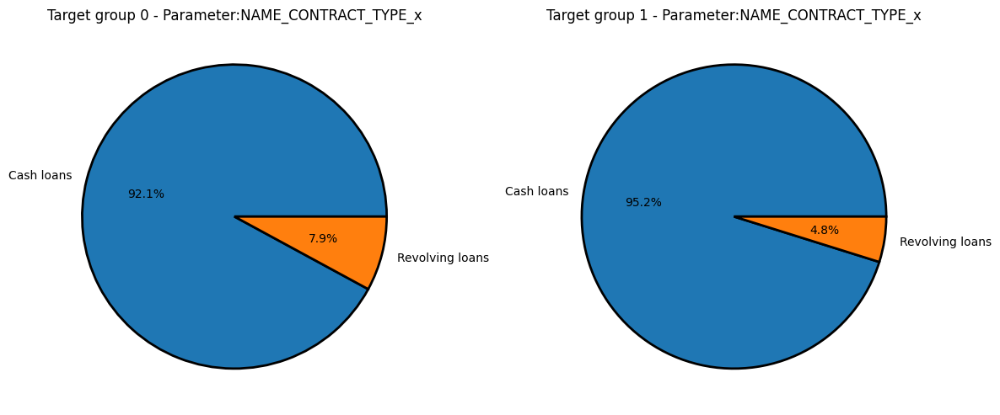

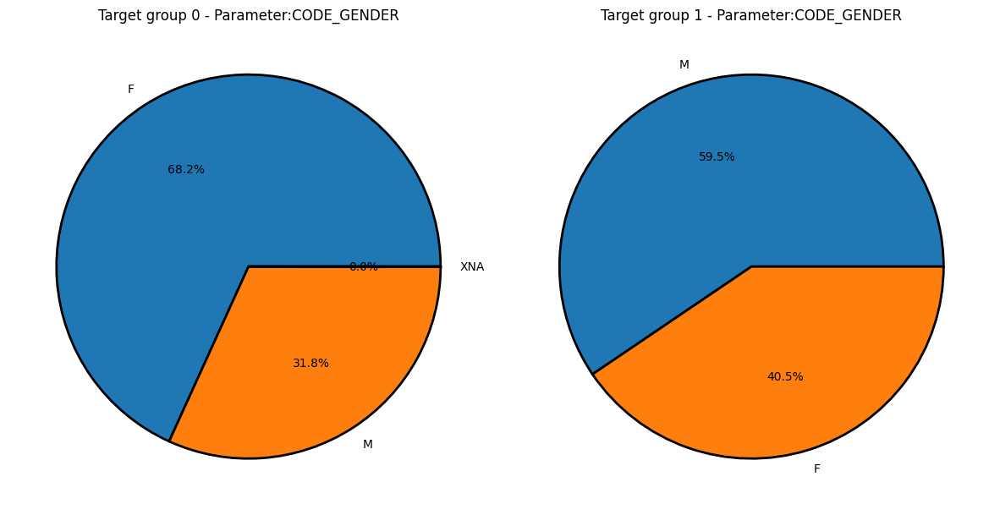

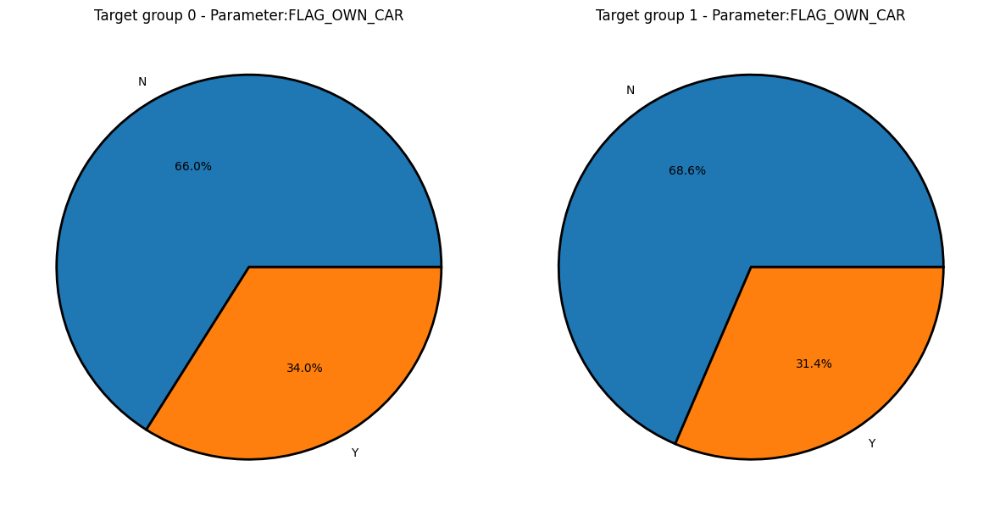

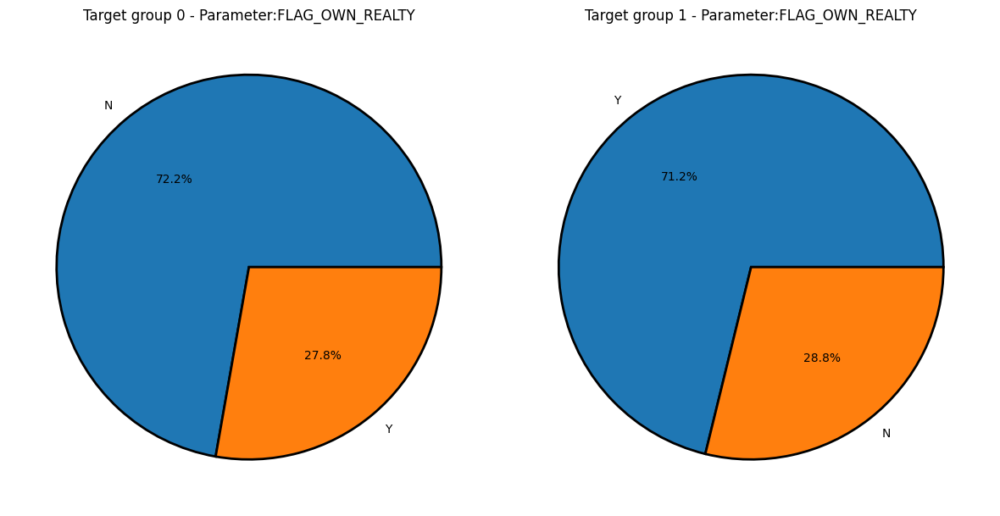

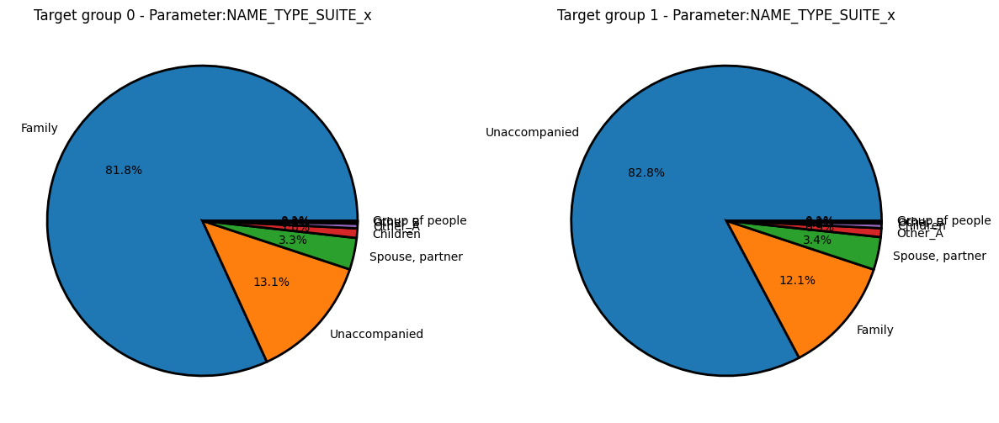

...

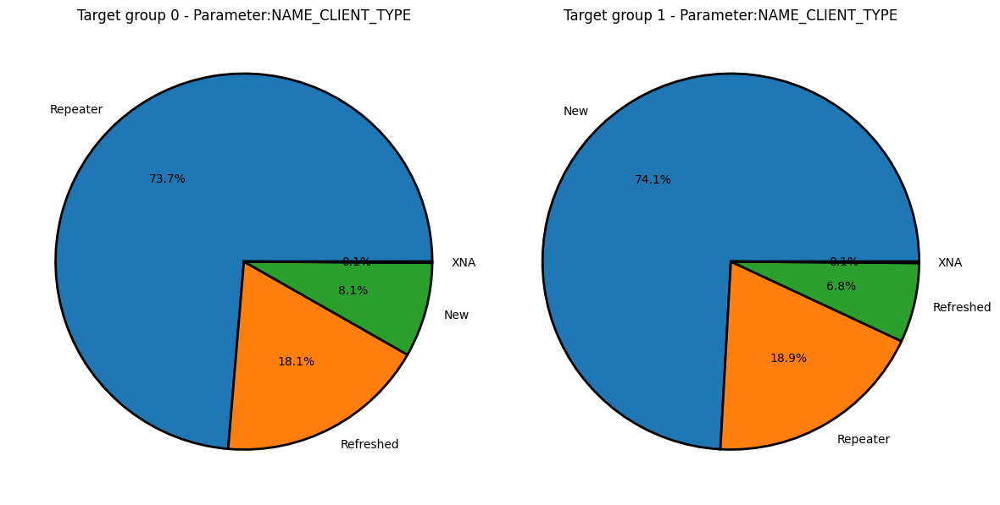

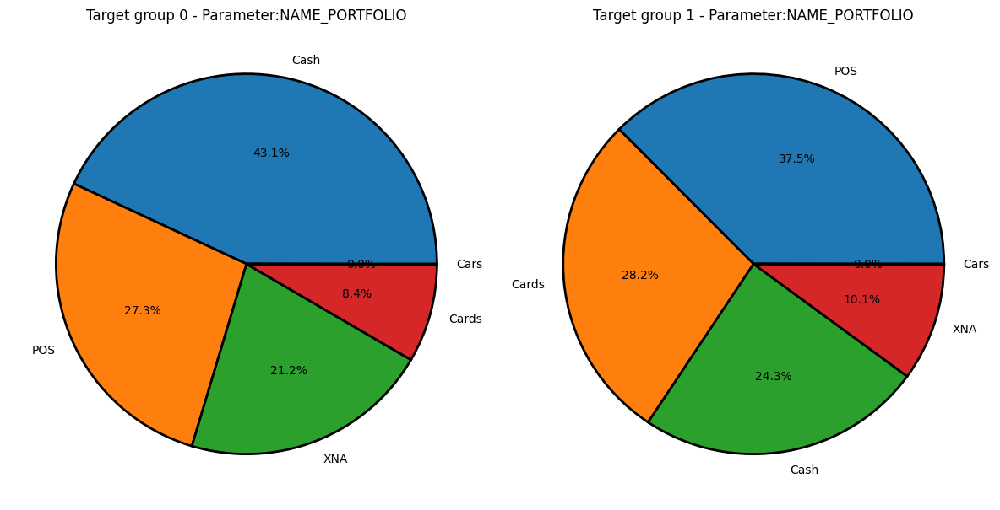

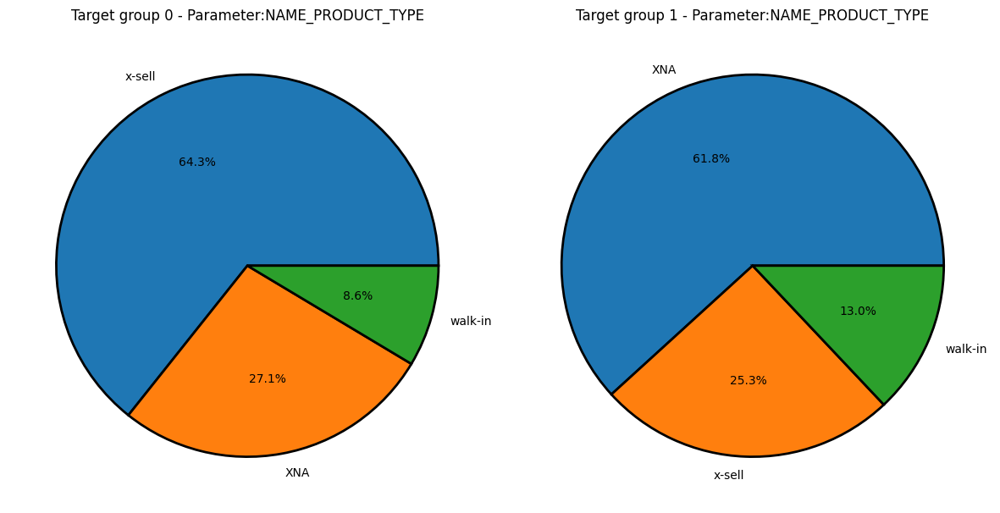

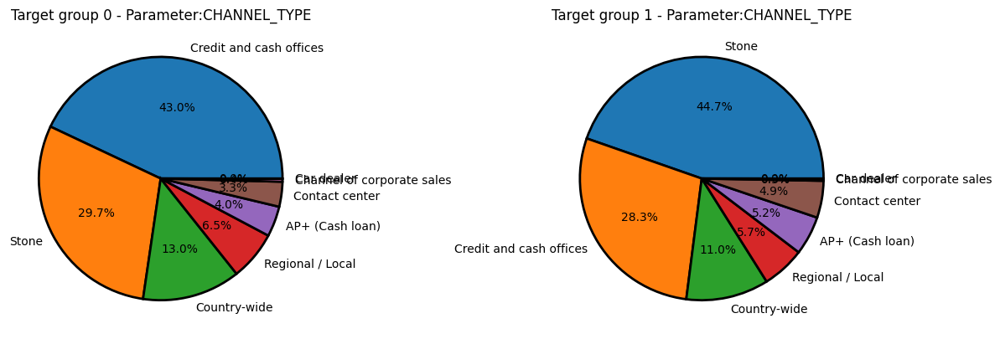

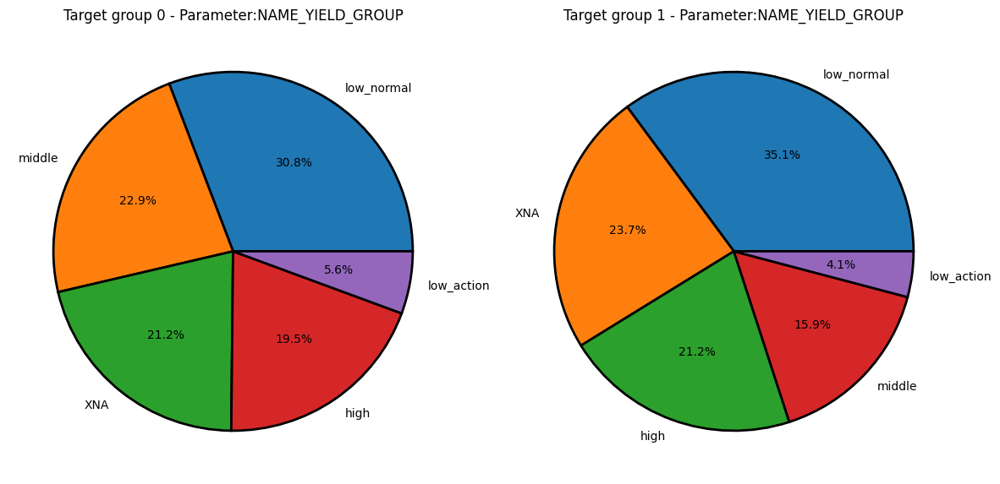

In [470]:
# Plotting pie chart for categorical columns unique values and their count - TARGET GROUP WISE
for cols in col_string:
    
    plot_piecount(common_df_0,common_df_1,cols)


    

# Inferences from pie chart
Pie Plot inferences:

1. Loan type
	Revolving loans have lesser  payment problems compared to Cash loans : 4.8% / 7.9%

2. **Gender**
	Females are better at paying loans compared to males.

3. Car ownership
	those who own a car have slightly better chances of being  able to pay loans - nearly 3% better chances

4. Real estate ownership
	Those who own a real estate : averages seem same for both target groups

5. **Name_suite (accompanied by)**
	Those who were accompanied by Family are much better at paying loans compared to others. Hence, "NAME_TYPE_SUITE" is an important parameter to check while deciding if loan  should be  awarded.

6. **Income type :**
	State servernts are pretty good at payments followed by Working class. Working class people TOP in the category of those who experience problem  in payments. 

7. **Education :** 
	Even though we saw, Secondary educated applicants were the most, But their biggest chunk falls in the category of those who have had problems in repayment. 
	Applicants with Higher education are the best at loan re-payments. hence, the most suitable candidates for awarding loan.

8. **Family Status:**
	Married people are best at loan repayment while Singles experience difficulties while paying back in most cases. Very important.

9. Housing type:
	same in both cases.

10. Weekday:
	Same in both cases

11. Contract status of previous application:
	Those who were approved loan in previous application are good at paying back in current loan also.

12. **Client Type:**

	Repeaters are the best at paying loans while New applicants are the riskiest as they experience the maximum cases of payment difficulties.

13.  Product type

	those who were using Product type x-sell in previous applications have good payment record. those with XNA are experiencing most payment problems

All other charts are not giving much - so ignoring them. 


# Running other type of analysis to see if any other parameters are playing any important role

In [471]:
corr_num = common_df_num.corr()
corr_num.shape

(84, 84)

In [472]:
corr_num

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,FLAG_MOBIL,FLAG_EMP_PHONE,...,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
SK_ID_CURR,1.000000,-0.001216,-0.002966,0.002743,-0.001275,-0.001456,-0.000530,0.000278,0.001303,-0.000862,...,-0.000634,-0.000410,0.001370,-0.000325,-0.001871,-0.001004,0.000399,-0.000288,-0.000161,0.001295
TARGET,-0.001216,1.000000,0.020310,-0.013946,-0.023635,-0.006705,-0.033239,-0.035312,0.000257,0.048353,...,-0.002887,0.039901,-0.002539,0.023689,-0.031154,-0.006651,0.018021,0.017522,0.016981,0.000653
CNT_CHILDREN,-0.002966,0.020310,1.000000,0.023224,0.003191,0.029781,-0.001141,-0.022364,0.000471,0.248259,...,0.000782,-0.012805,0.000773,-0.046471,-0.001950,0.005048,0.000711,-0.011007,-0.009546,-0.055692
AMT_INCOME_TOTAL,0.002743,-0.013946,0.023224,1.000000,0.372096,0.456861,0.379564,0.177626,0.000448,0.149954,...,0.000061,0.010191,0.003870,0.037770,-0.021286,-0.001591,0.018273,0.001520,0.002024,0.007275
AMT_CREDIT_x,-0.001275,-0.023635,0.003191,0.372096,1.000000,0.774790,0.978914,0.085379,0.000688,0.063120,...,0.000950,-0.060406,0.003492,0.036191,-0.008543,0.001956,0.011588,-0.060214,-0.052307,-0.015947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DAYS_FIRST_DUE,-0.001004,-0.006651,0.005048,-0.001591,0.001956,0.001010,0.000063,0.001525,NaN,0.017792,...,-0.001581,0.178028,-0.002307,-0.198832,0.004157,1.000000,0.503316,0.396908,0.321126,-0.114857
DAYS_LAST_DUE_1ST_VERSION,0.000399,0.018021,0.000711,0.018273,0.011588,0.002807,0.004307,0.006896,NaN,0.041710,...,-0.001708,0.082870,-0.007218,-0.377532,-0.809046,0.503316,1.000000,0.415094,0.490211,-0.218822
DAYS_LAST_DUE,-0.000288,0.017522,-0.011007,0.001520,-0.060214,-0.065041,-0.065448,-0.005531,NaN,-0.018189,...,-0.003098,0.449922,-0.006140,0.101522,-0.254270,0.396908,0.415094,1.000000,0.927741,0.018773
DAYS_TERMINATION,-0.000161,0.016981,-0.009546,0.002024,-0.052307,-0.060456,-0.058349,-0.004412,NaN,-0.013942,...,-0.001504,0.399752,-0.006508,0.065366,-0.396470,0.321126,0.490211,0.927741,1.000000,0.001998


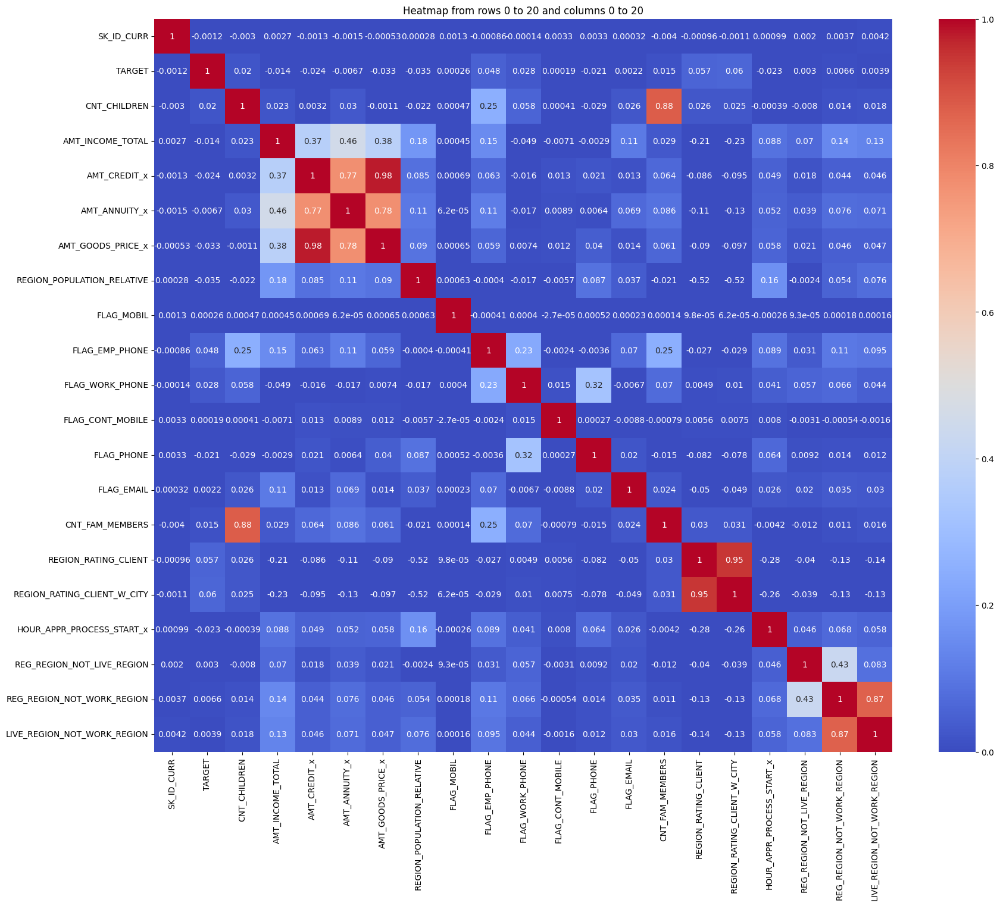

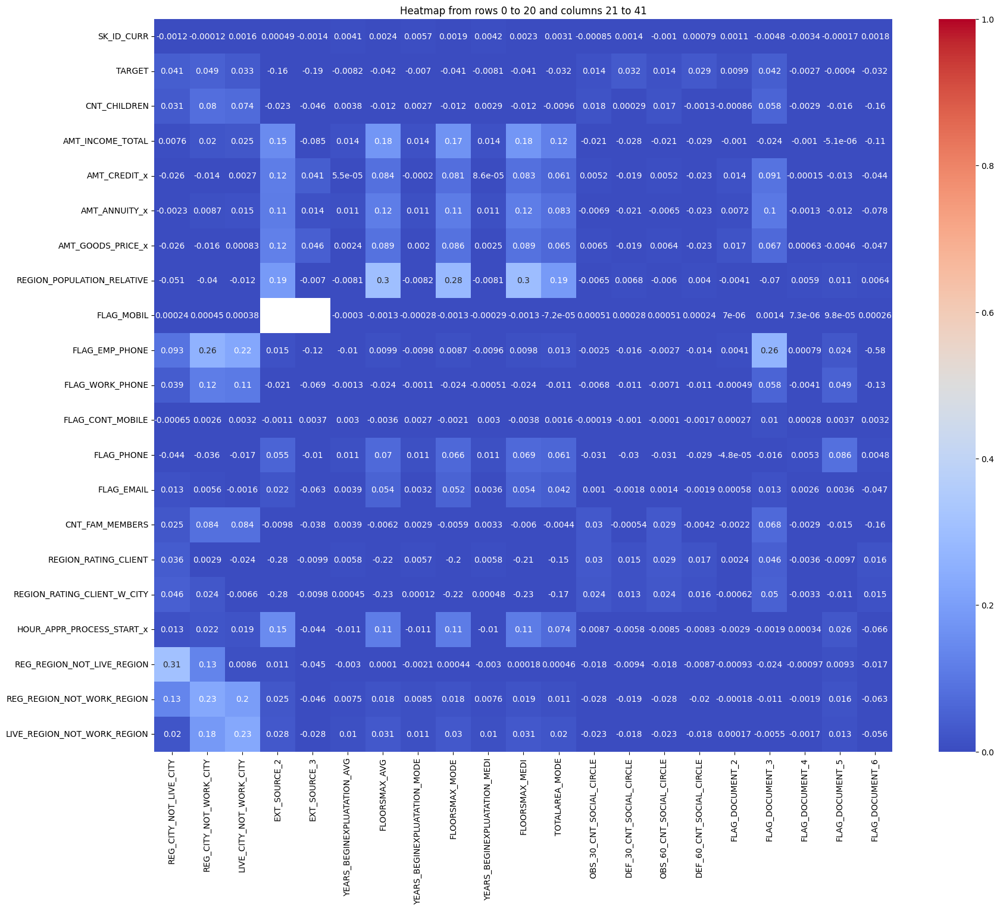

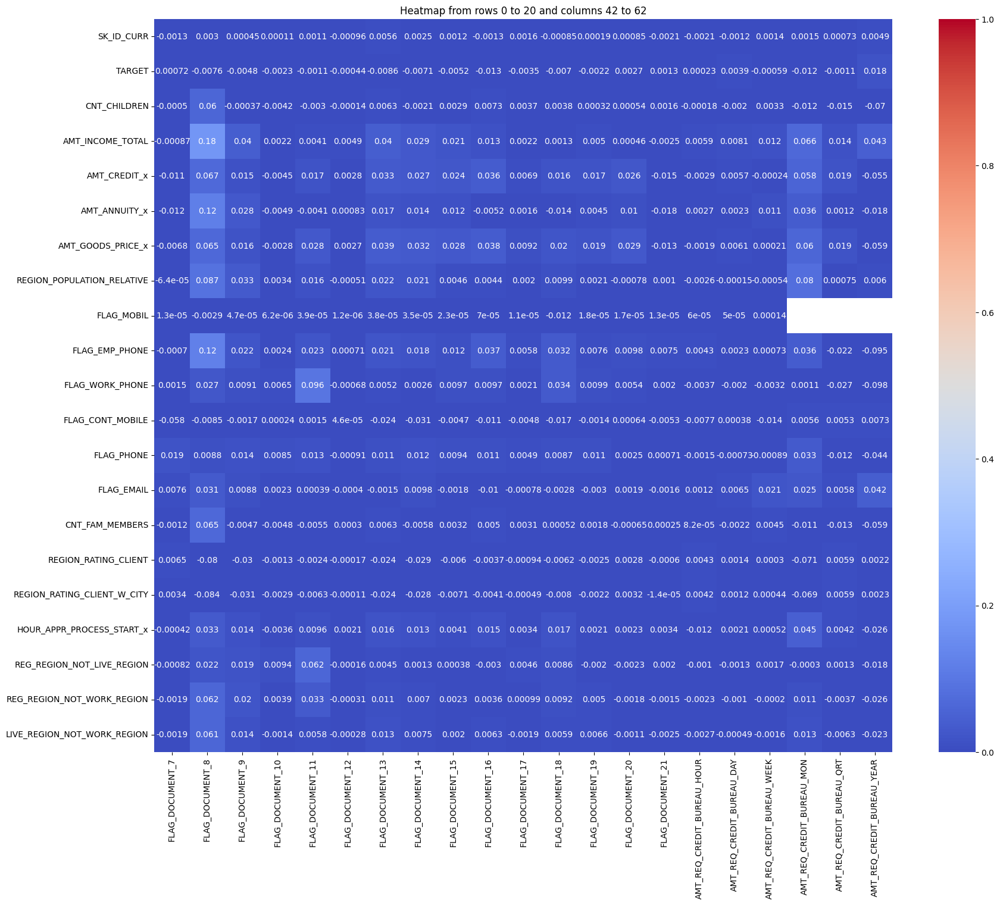

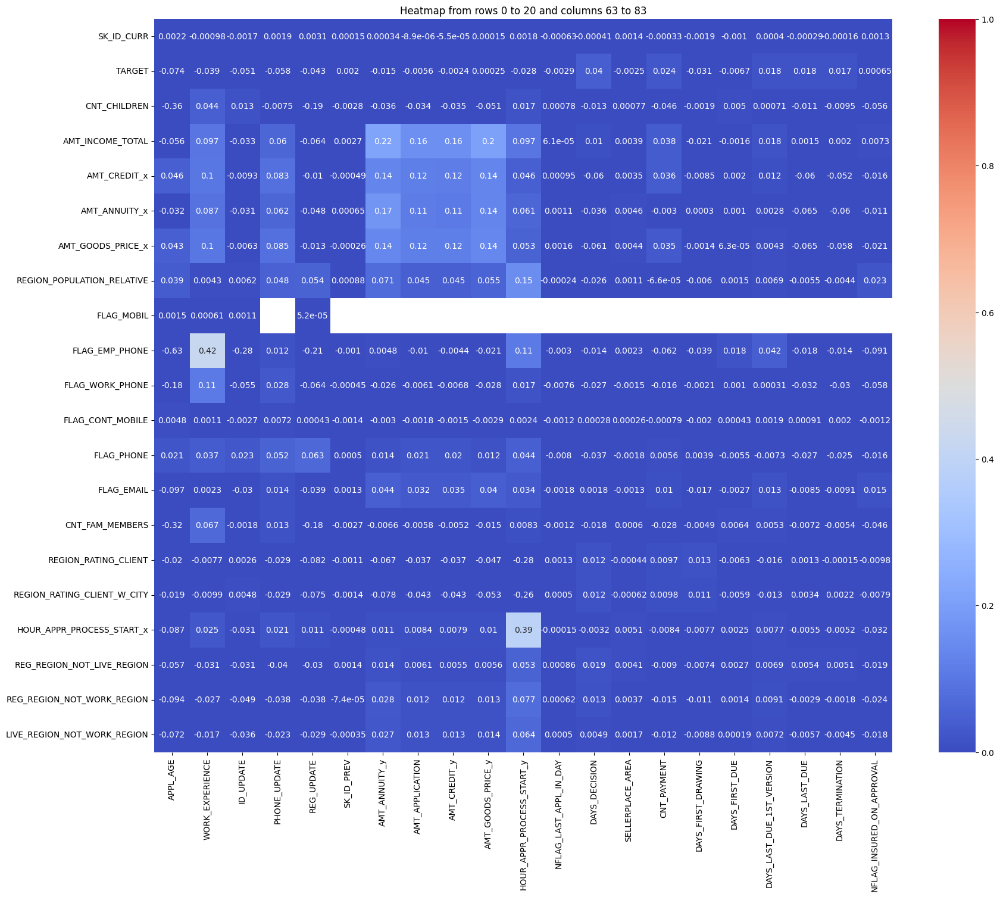

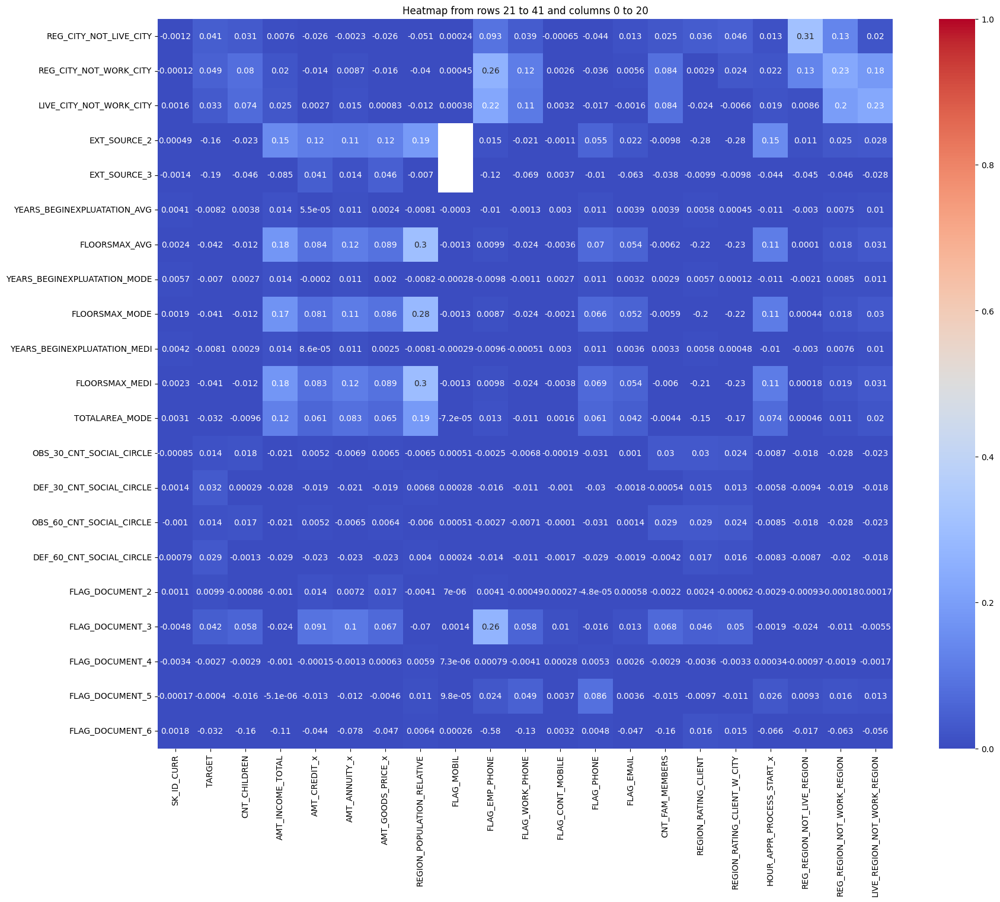

...

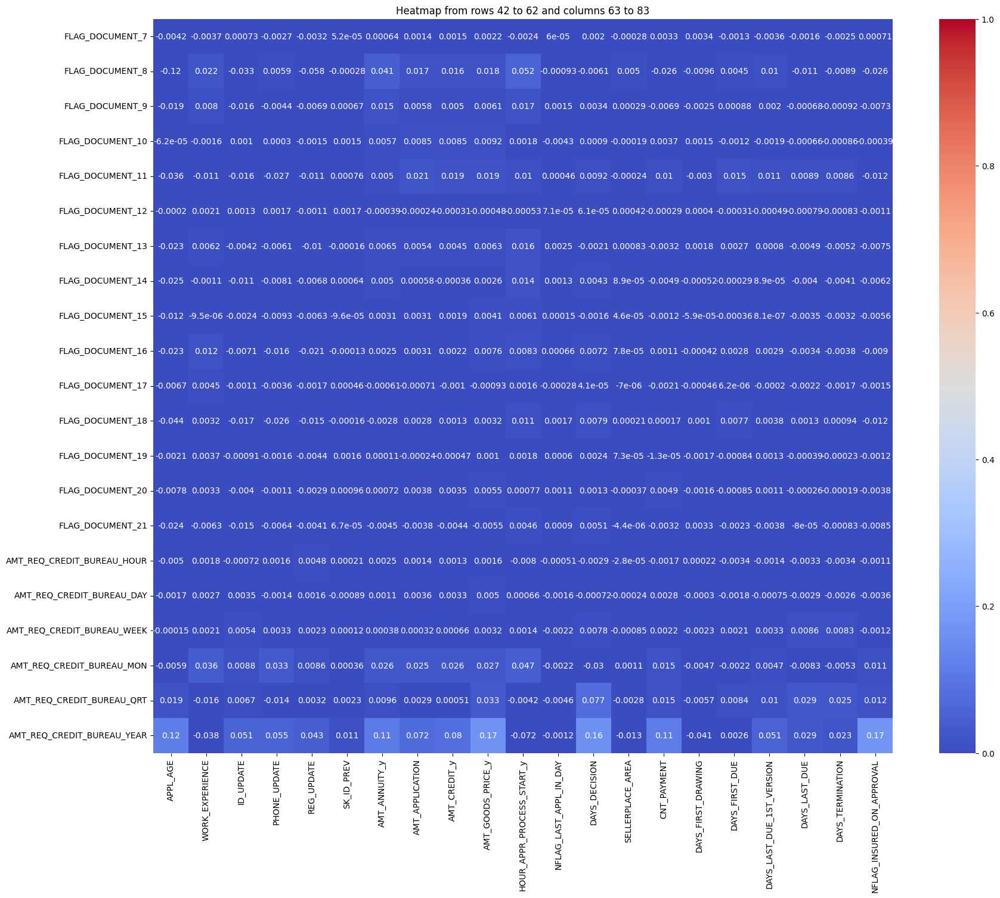

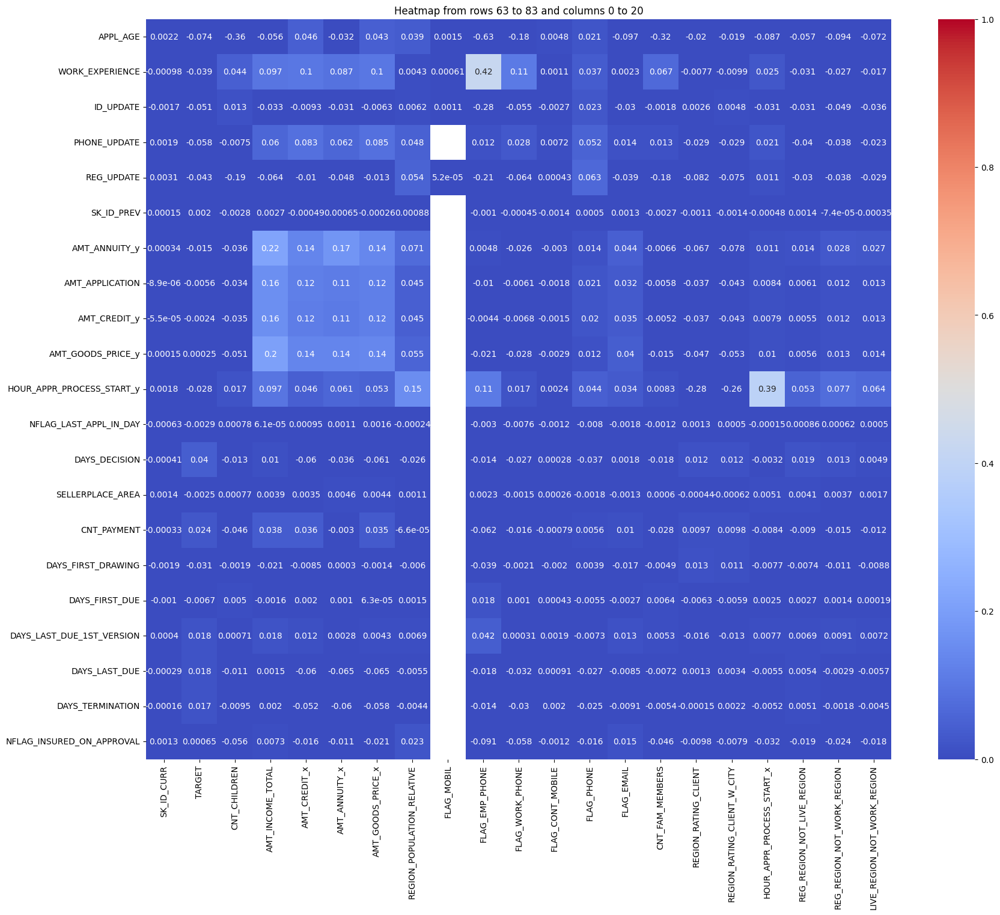

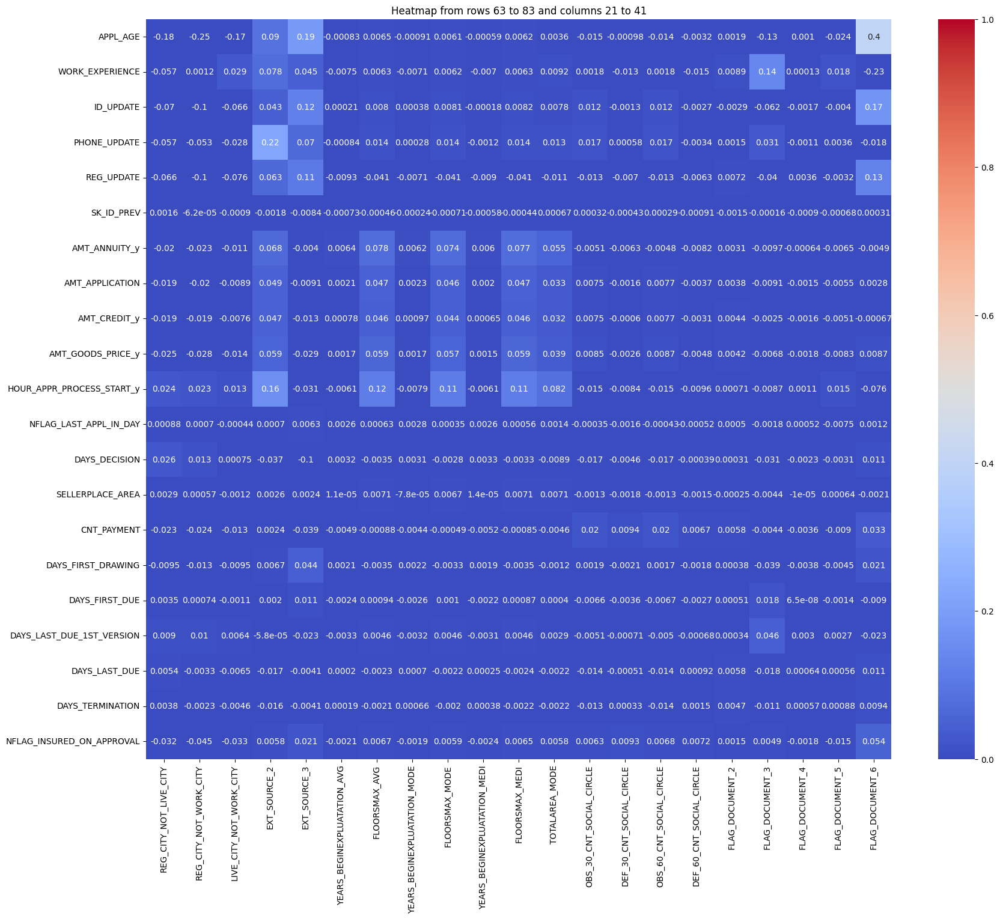

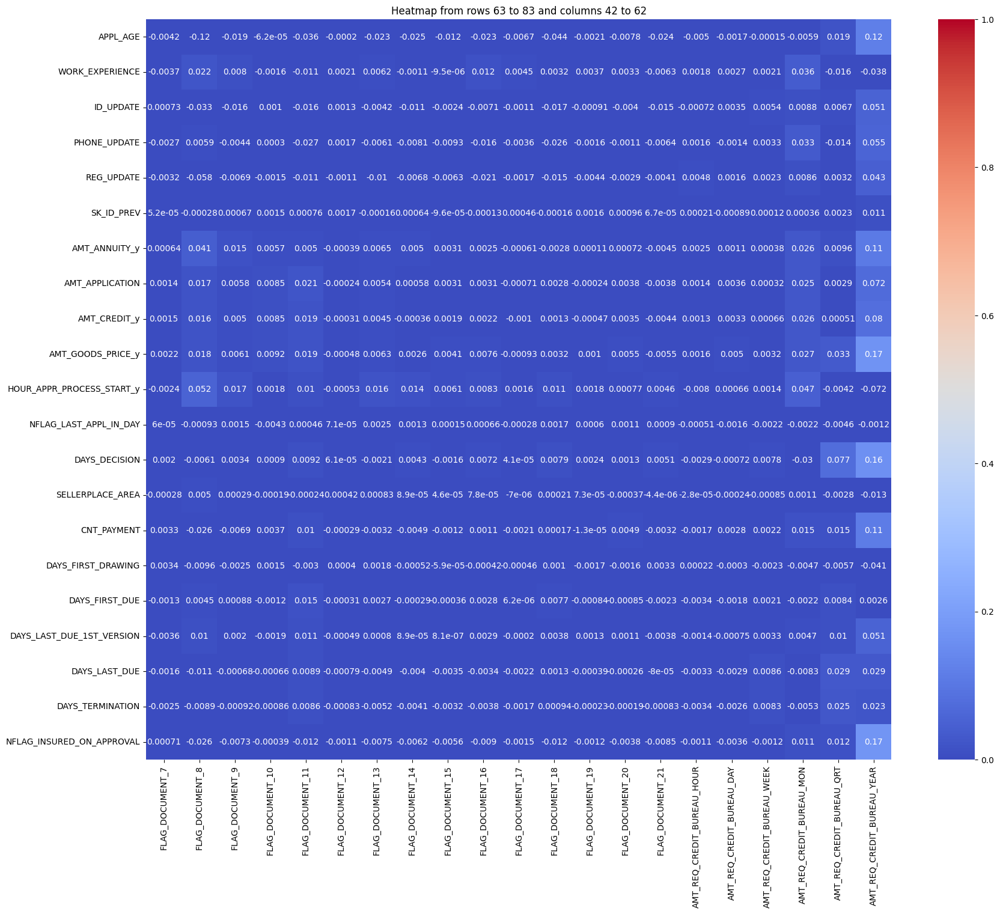

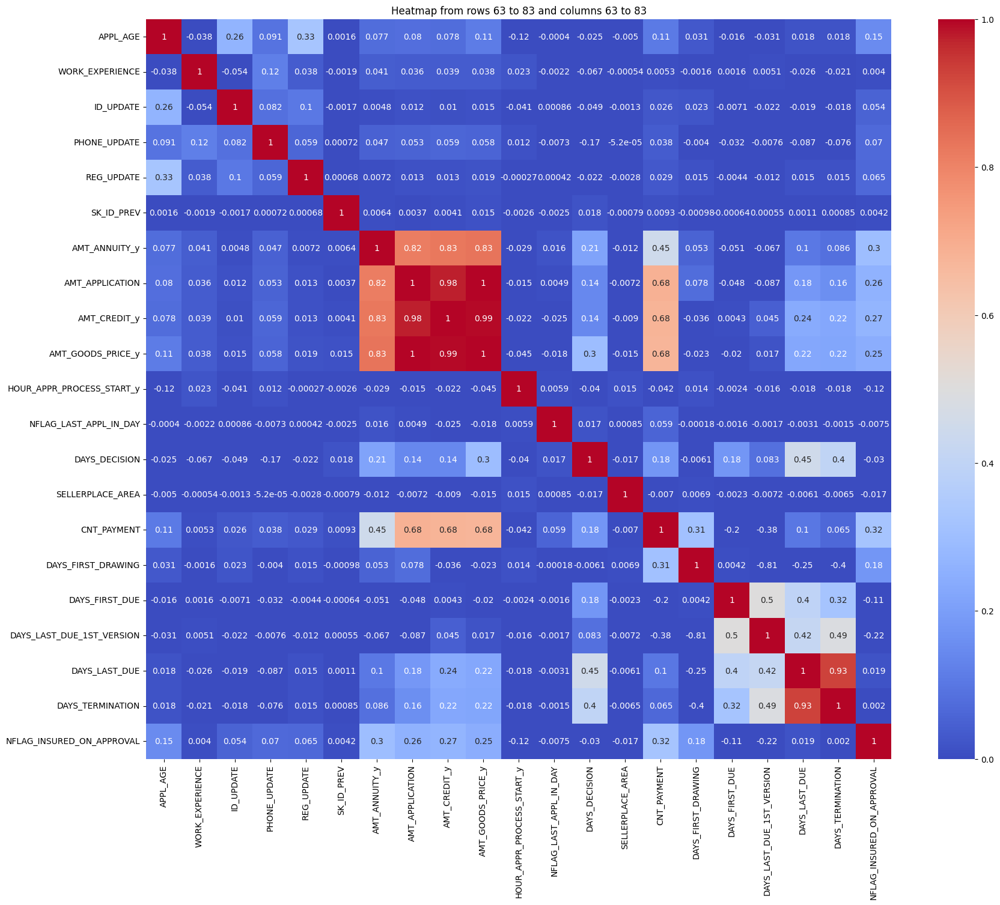

In [473]:

chunk_size = 21

# Loop to create heatmaps in chunks of 21x21
for i in range(0, 84, chunk_size):
    for j in range(0, 84, chunk_size):
        plt.figure(figsize=(20, 16))  # Adjust the figure size for each chunk
        sns.heatmap(corr_num.iloc[i:i + chunk_size, j:j + chunk_size], 
                     cmap='coolwarm', 
                     vmin=0, 
                     vmax=1,
                     annot=True,  # Set to False if annotations make it cluttered
                     cbar=True)  # Color bar for reference
        
        plt.title(f"Heatmap from rows {i} to {min(i + chunk_size - 1, 83)} and columns {j} to {min(j + chunk_size - 1, 83)}")
        plt.show()

Strong correlations found between:

1. AMT_GOODS_PRICE_x & AMT_CREDIT_X

2. AMT_CREDIT_x  &  AMT_ANNUITY_x

3. AMT_ANNUITY_x & AMT_GOODS_PRICE_x

4. CNT_CHILDREN & CNT_FAM_MEMBERS

5. DAYS_LAST_DUE vs DAYS_TERMINATION

6. REGION_RATING_CLIENT_W_CITY & REGION_RATING_CLIENT

7. REG_REGION_NOT_WORK_REGION & LIVE_REGION_NOT_WORK_REGION



Moderatley effective relations

1. CNT_PAYMENT vs AMT_APPLICATION

2. AMT_CREDIT_y vs CNT_PAYMENT

3. AMT_GOODS_PRICE_y =CNT_PAYMENT

***This is only for understanding - as their direct correlation with TARGET GROUP is not seen here***
**Running scatterplot on all with hue of TARGET**

In [474]:
def scatplot_generator(df1,df2, axis1, axis2):

    # Create a figure with 2 subplots arranged side by side
    fig, axes = plt.subplots(ncols=2, figsize=(12, 5))

    # First scatter plot on the first subplot
    sns.scatterplot(data=df1, x=axis1, y=axis2, ax=axes[0], color='blue')
    axes[0].ticklabel_format(style='plain')  # Set plain format for tick labels
    axes[0].set_title(f'Applicants with all other cases: {axis1}')

    # Second scatter plot on the second subplot
    sns.scatterplot(data=df2, x=axis1, y=axis2, ax=axes[1], color='orange')
    axes[1].ticklabel_format(style='plain')  # Set plain format for tick labels
    axes[1].set_title(f'Applicants  with payment difficulties {axis2}')

    # Display the plots
    plt.tight_layout()  # Adjust spacing
    plt.show()

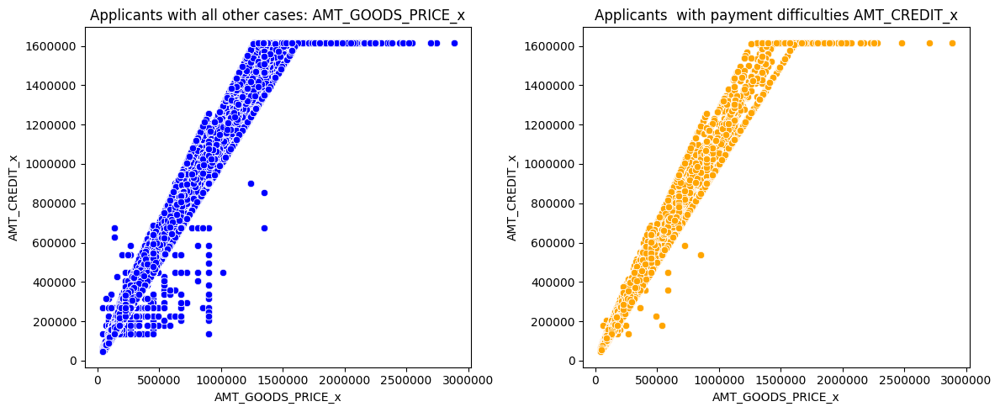

In [475]:
# AMT_GOODS_PRICE_x & AMT_CREDIT_X
scatplot_generator(common_df_0,common_df_1,'AMT_GOODS_PRICE_x', 'AMT_CREDIT_x' )

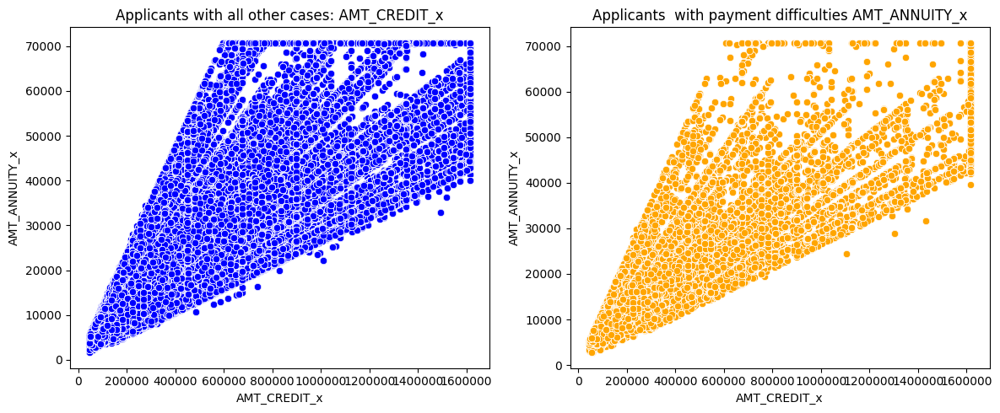

In [476]:
# AMT_CREDIT_x  &  AMT_ANNUITY_x
scatplot_generator(common_df_0,common_df_1,'AMT_CREDIT_x', 'AMT_ANNUITY_x' )


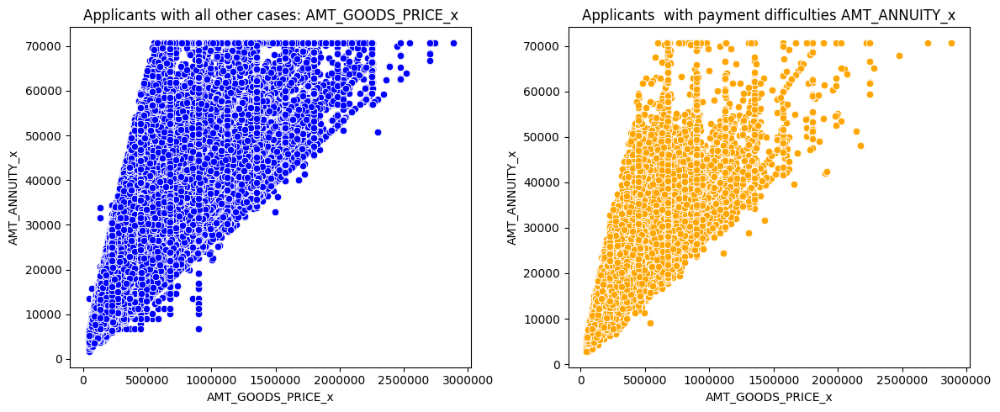

In [477]:
# AMT_ANNUITY_x & AMT_GOODS_PRICE_x
scatplot_generator(common_df_0,common_df_1,'AMT_GOODS_PRICE_x', 'AMT_ANNUITY_x' )


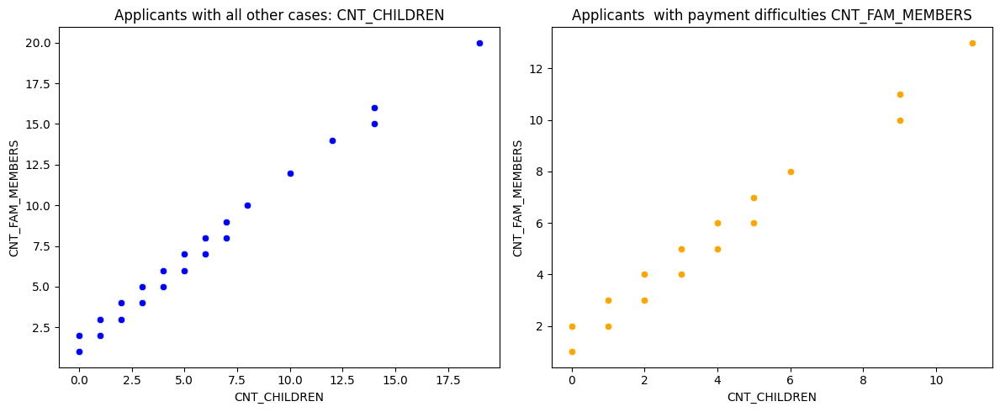

In [478]:
# CNT_CHILDREN & CNT_FAM_MEMBERS
scatplot_generator(common_df_0,common_df_1,'CNT_CHILDREN', 'CNT_FAM_MEMBERS' )

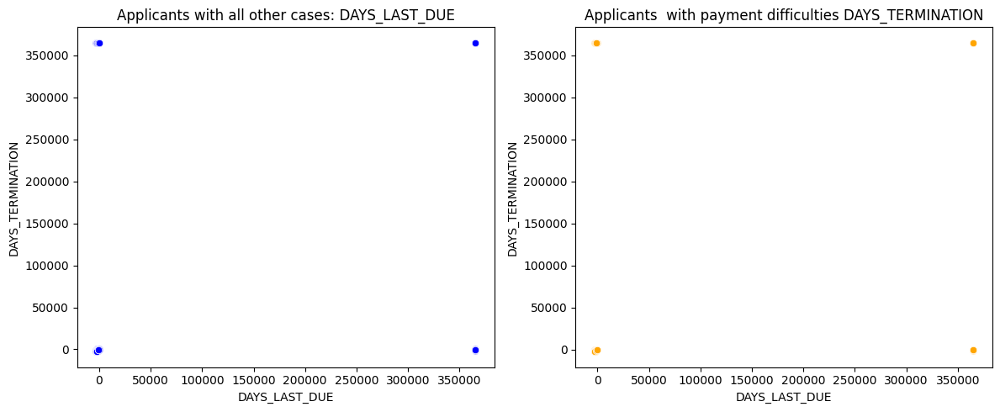

In [479]:
# DAYS_LAST_DUE vs DAYS_TERMINATION
scatplot_generator(common_df_0,common_df_1,'DAYS_LAST_DUE', 'DAYS_TERMINATION' )

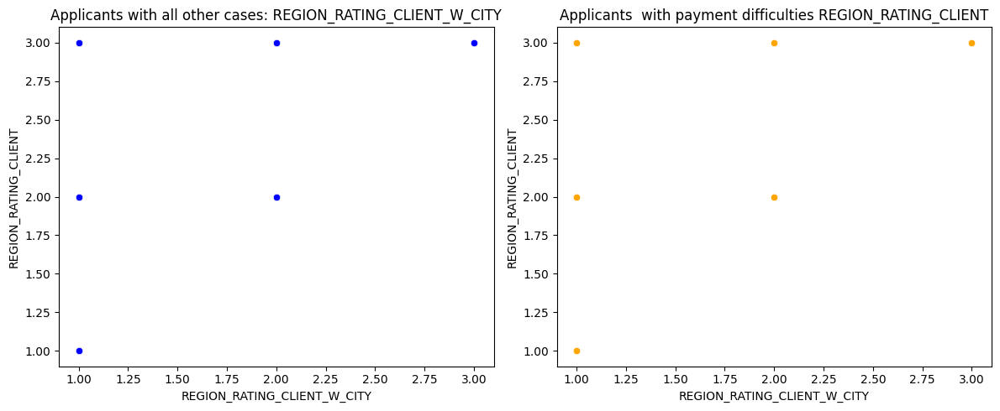

In [480]:
# REGION_RATING_CLIENT_W_CITY & REGION_RATING_CLIENT
scatplot_generator(common_df_0,common_df_1,'REGION_RATING_CLIENT_W_CITY', 'REGION_RATING_CLIENT' )

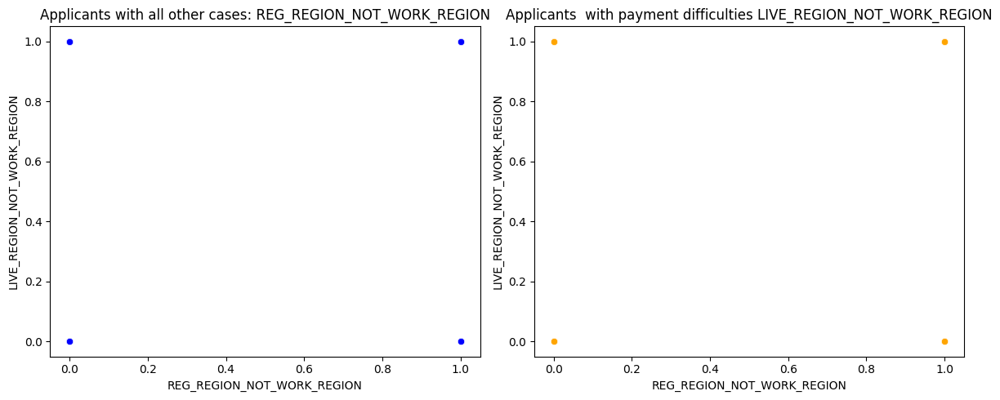

In [481]:
# REG_REGION_NOT_WORK_REGION & LIVE_REGION_NOT_WORK_REGION
scatplot_generator(common_df_0,common_df_1,'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION' )

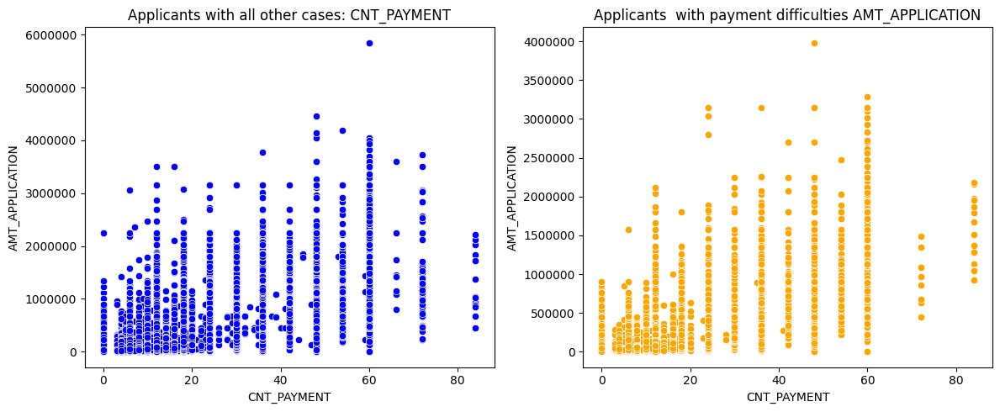

In [482]:
# CNT_PAYMENT vs AMT_APPLICATION
scatplot_generator(common_df_0,common_df_1,'CNT_PAYMENT', 'AMT_APPLICATION' )

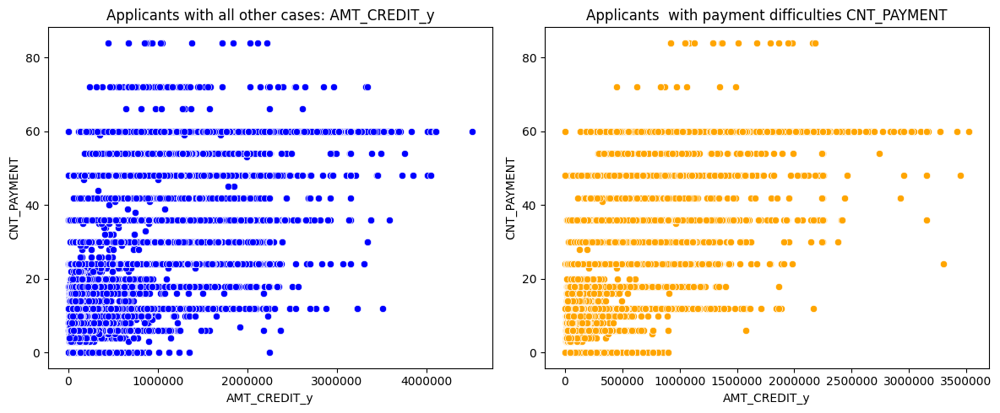

In [483]:
# AMT_CREDIT_y vs CNT_PAYMENT
scatplot_generator(common_df_0,common_df_1,'AMT_CREDIT_y', 'CNT_PAYMENT' )

***Inference : Although there are parameters that show high  correlation  and some that do not - yet there is no such combination that shows a different behavior for those with Payment difficulties vs those with all other cases***

****Focussing on bivariate analysis of categorical columns with other numerical values to find  a good differential factor that explicitly distinguishes  the two cases****

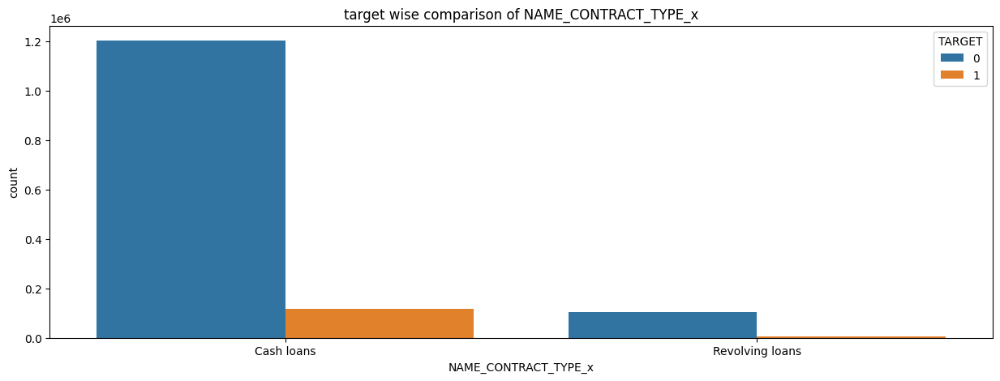

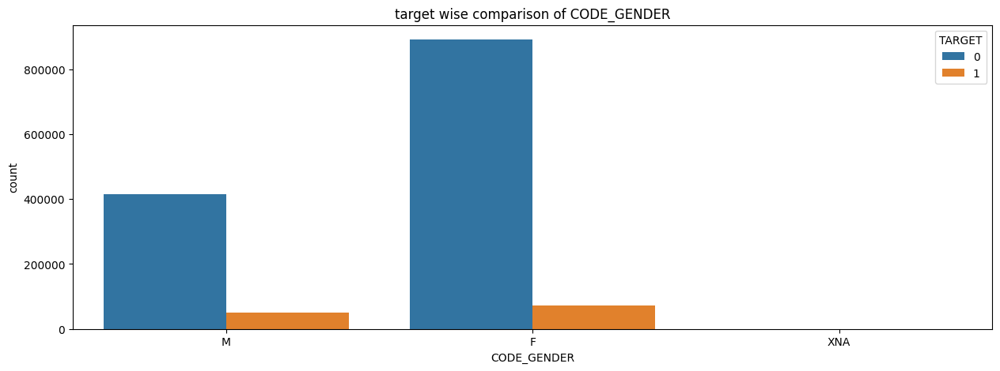

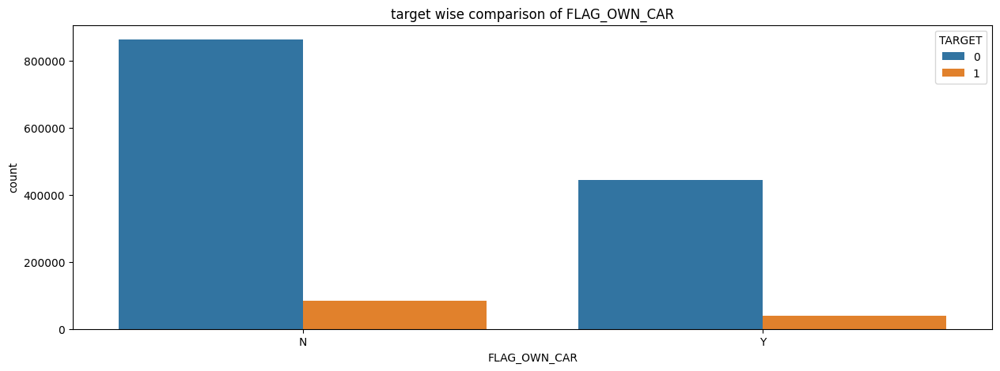

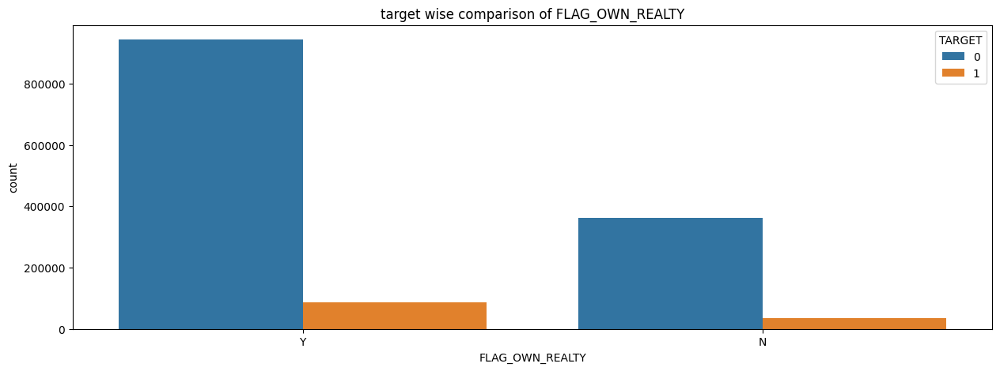

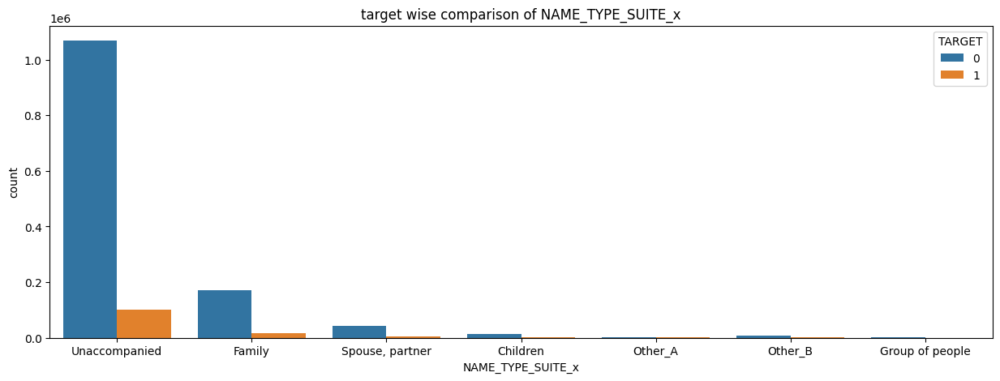

...

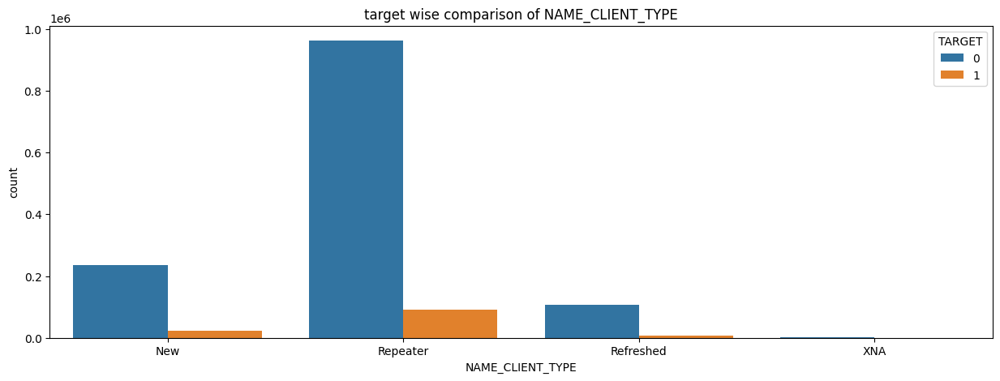

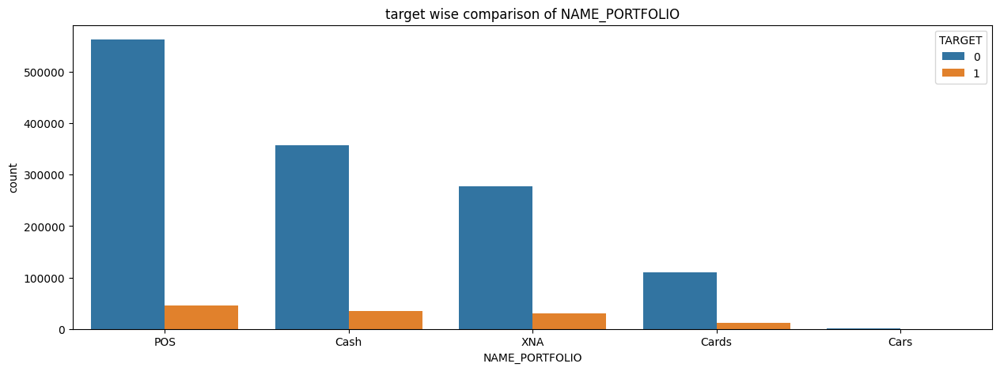

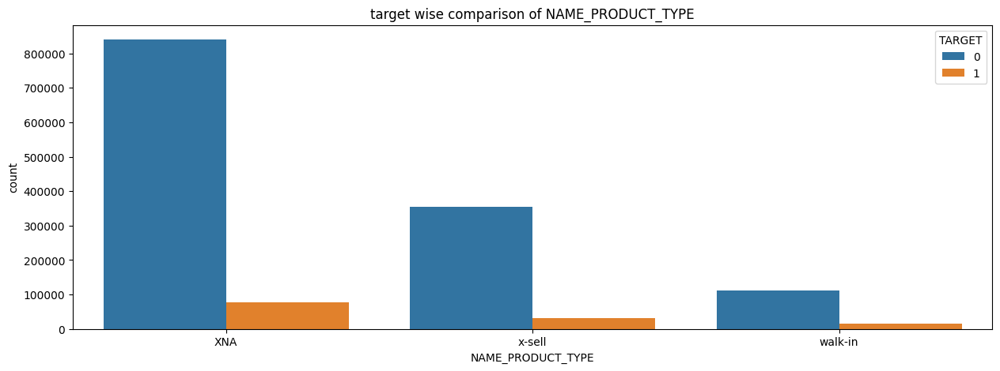

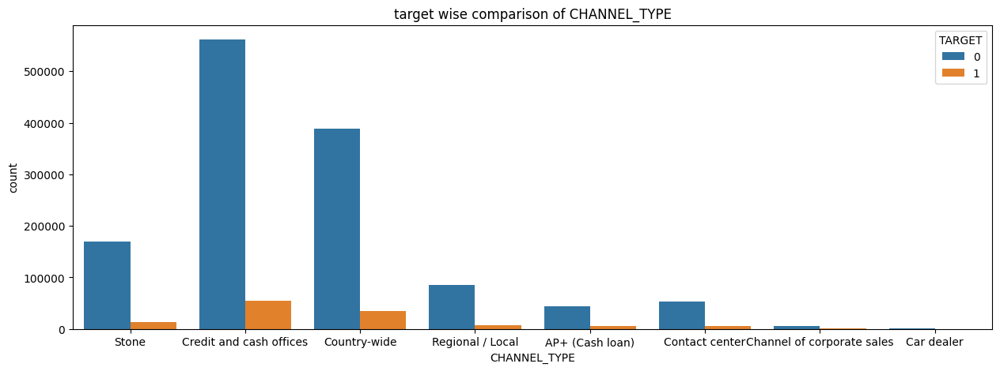

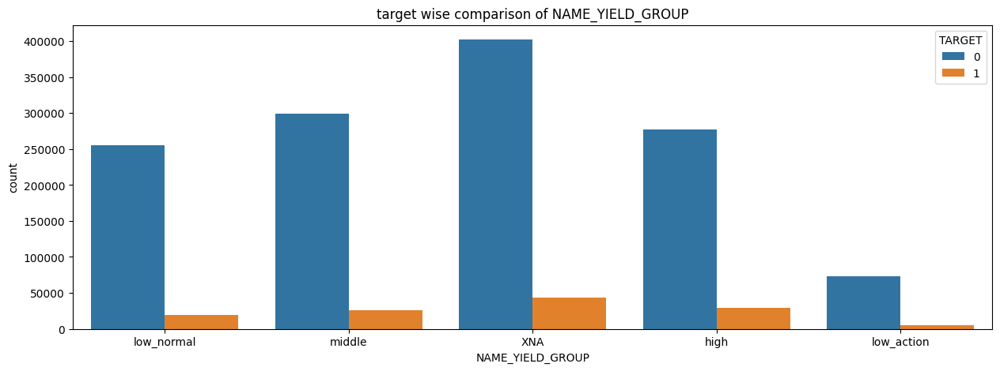

In [485]:
for col in col_string:

    plt.figure(figsize=(15,5))
    sns.countplot(data=common_df, x=col, hue='TARGET')
    plt.title(f'target wise comparison of {col}')
    plt.show()

# Count plot inferences:

Count plot inferences:

1. Contract type wise : 
	very high imbalance on Cash loans.
	ratio of 0 and 1 seems similar for all loan types. hence no distinguishing factor.

2. Gender : 
	Females apply far more for the loans compared to men. However, male feel find more difficulties paying.. to be proven with ratio. 

3. Car Ownership:
	very high number of people who apply loans do not have car.
	no visible differentiation in behavior between those who own and those who dont own a car.

4. Realty ownership:
	there are more applicants with realty who apply for loan than those who don't
	same like car ownership, no differentiation.

5. Suite type (Who accompanied customer during prev application) - (OLD and NEW)
	People mostly visit unaccompanied, followed by Family.
	visibly no differentiation.. ratio to be checked.

6. Income type:
	Working people form biggest chunk of applicants.
	payment difficulty ratio seems higher for commercial associates and Pensioners. ratio calculation to be done to objectify number

7. Education:
	applicants are mostly either secondary educated and then followed by those with "higher education". all others constitute a small part. 

	No visible differentiating behavior

8. Family status:
	Most of applicants are married, followed by Single.
	those in civil marriage have higher visible ratio of applicants with payment difficulties compared to others. objectify with ratio calculation.

9. housing type :
	Most of applicants have House/Apartment. 
	those who live with parents have higher ratio of applicants with payment difficulties

10. Application processing day (OLD and Current)
	no visible difference. lesser business of credit on weekends. 

11. EMERGENCYSTATE_MODE:
	this parameter is heavily biased on "NO"
	no visible differentiation

12. Contract type (loan type):
	Consumer and cash loans are the most in demand, though almost equal to each other. Revolving loans on third number. 
	Applicants are finding slightly more difficulty on cash loans compared to Consumer loans. THis may be due to amount of loan. can be checked. 

13. Contract status (from previous application):
	those who were awarded loan last time are the highest with ease of payment in current applications as well. 
	However, differentiation ratio across types to be checked.. visibly not identifiable.

14. Payment type:
	Most of people prefer to pay by "Cash  through the bank".
	XNA type applicants have higher numbers having issues in paying back.

15. Rejection_reason:
	for prev applications, XAP was the biggest reason for loan rejection. however, a very good percentage of those have not faced difficulty in paying back now. 
	HC (High credit ratio ? ) applicants in previous applications, have higher ratio of paying back again

16. Client type:
	Repeaters are the biggest chunk of the current applicants as well. 
	differentiation ratio seems same across all types. 

17. Portfolio : 
	POS is the most common Portfolio type, followed by Cash.
	ratio to be calculated . "CASH" category seems to have higher ratio of payment difficulties

18. Channel_type:
	Credit and cash offices bring the maximum business for company. 
	County wide seems to have higher ratio. to be checked

19. yield group (Loan rate grouping):
	XNA is the most commmon type of RoI group though not clear about its meaning. 
	ratio seems similar across categories. 

**The analysis indicates a clear need for calculating ratio of all cateories to confirm**

**Calculating the ratios of all those columns in next cell.**

# Outcome : 
Following are the most important Parameters that affect the outcome as mentioned in the above cell

***Gender , Income type, Education , Family Status , Client type***

out of these parameters, the most effective correlations seen are : 

****1. Gender
2. Education
3. Family status****


# Project Conclusion : 

***For use case :*** important insights are derived from the project for the client if any. 

***for Personal benefit :*** This project has given me enough confidence to handle big data and deal with multiple various parameters without having deep interactive understanding from the client. 